In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob

def clear_previous_features(directory):
    # Eliminar todos los archivos .pkl en el directorio especificado
    files = glob.glob(os.path.join(directory, '*.pkl'))
    for f in files:
        try:
            os.remove(f)
            print(f'Eliminado: {f}')
        except Exception as e:
            print(f'No se pudo eliminar {f}. Error: {str(e)}')

# Directorio donde guardas las características
save_dir = "/content/drive/MyDrive/PANCANCER FINAL"

# Llamada a la función para limpiar los archivos previos
clear_previous_features(save_dir)


In [ ]:
import os

# Obtener el número de núcleos
num_cores = os.cpu_count()
print(f"Número de núcleos de CPU: {num_cores}")


Número de núcleos de CPU: 12


In [ ]:
import torch

if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU en uso: {gpu_name}")
    print(f"Memoria total de la GPU: {torch.cuda.get_device_properties(0).total_memory / (1024 ** 3):.2f} GB")
else:
    print("No se encontró una GPU disponible.")


GPU en uso: NVIDIA L4
Memoria total de la GPU: 22.17 GB


In [ ]:
!pip install umap-learn shap
!pytorch-lamb

/bin/bash: line 1: pytorch-lamb: command not found


In [ ]:
import pandas as pd
clinicos = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/meta_sinFPPP.pkl')
clinicos

,Unnamed: 0,data_type,updated_datetime,file_name,md5sum,data_category,experimental_strategy,project,sample_uuid,sample_barcode,...,panel,histology,tissue_site,stage,T,N,M,residual_tumor,new_tumor_events,follow_ups
file_id,,,,,,,,,,,,,,,,,,,,,
9fe7d0f4-866d-490f-b2cb-d9be7da889de,7001,Gene Expression Quantification,2016-05-26T20:51:28.753650-05:00,1db2cfc5-346d-4398-9dd4-8b92435059fd.htseq.cou...,bff9318f04ad067bccc0fbd2d31b45f1,Transcriptome Profiling,RNA-Seq,TCGA,9259e9ee-7279-4b62-8512-509cb705029c,TCGA-DD-AAVP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,2.0,1.0
dd74434f-300f-4798-8342-aad31b192e12,8001,Gene Expression Quantification,2016-05-26T21:04:47.187859-05:00,5f4cf592-e135-43ff-9c11-bcba462626d3.htseq.cou...,92cf7b5b7f0a0f5dfa02919c586b72c7,Transcriptome Profiling,RNA-Seq,TCGA,bccb7f9d-8dde-45b7-a50d-6c7233239ceb,TCGA-KK-A7B2-01A,...,PRAD,Prostate Adenocarcinoma Acinar Type,Prostate,NaN,T3a,N1,NaN,R0,2.0,1.0
07db9e9d-059d-4e6c-b483-81517a492b96,1001,Gene Expression Quantification,2016-05-26T21:04:48.015693-05:00,aa4a76e4-5348-479c-8beb-3e4e34e18ce9.htseq.cou...,503fa39eb3a770b869ab0c4297fd0d43,Transcriptome Profiling,RNA-Seq,TCGA,03877fe0-b0d6-4800-be46-b45c70350e48,TCGA-DC-6158-01A,...,READ,Rectal Adenocarcinoma,Rectum,Stage I,T2,N0,M0,R0,3.0,2.0
47ee860a-fd18-48f2-bfe7-4e19391950bd,2001,Gene Expression Quantification,2016-05-26T21:04:48.692729-05:00,0c172934-64ff-44dc-bdba-4c738f5692ea.htseq.cou...,c61b88a22488a1a0d2fb3e7739db0b32,Transcriptome Profiling,RNA-Seq,TCGA,8d3e521b-6df4-4633-bb44-7647ded94130,TCGA-DD-A4NP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,3.0,2.0
e322b0e5-458a-4cbf-a64f-9b348e413939,5001,Gene Expression Quantification,2016-05-26T21:04:49.266949-05:00,3025ad45-1d29-4c05-b90f-3d4a348c82c6.htseq.cou...,d279845ef0505630cf5a2ee4b1be5cac,Transcriptome Profiling,RNA-Seq,TCGA,8fef5013-4e57-4043-8770-a56135aeac9b,TCGA-HQ-A5ND-01A,...,BLCA,Muscle invasive urothelial carcinoma (pT2 or a...,Bladder,Stage IV,T3b,N1,M0,NaN,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3999,Gene Expression Quantification,2016-06-01T23:31:30.205560-05:00,1ef78255-1b5c-42af-aa81-128c1b009114.htseq.cou...,4e139effd7c17a3b6f8c8a2dcf1ba2f5,Transcriptome Profiling,RNA-Seq,TCGA,f03d9b83-a4d7-4e77-abaa-5c3dbee0bcf3,TCGA-BP-4790-01A,...,KIRC,Kidney Clear Cell Renal Carcinoma,Kidney,Stage I,T1a,NX,M0,NaN,2.0,1.0
673a85f3-ba5e-448a-acee-dfec77b5238e,8000,Gene Expression Quantification,2016-06-01T23:31:30.867514-05:00,d07c7238-807f-48b1-bf06-deaa6200f4aa.htseq.cou...,b07dddd077d9db4f26b3e2ae066555c4,Transcriptome Profiling,RNA-Seq,TCGA,d90a2617-bf0b-453f-a483-ceac82781a6c,TCGA-N9-A4Q4-01A,...,UCS,Uterine Carcinosarcoma/ Malignant Mixed Muller...,Uterus,NaN,NaN,NaN,NaN,R0,1.0,0.0
3d93b2ae-7730-4914-af23-ff3554752922,9000,Gene Expression Quantification,2016-06-01T23:31:31.468195-05:00,3c5b65ad-998a-4124-814f-760de89f05d0.htseq.cou...,2046f591b06fa9eafb79d667f7942795,Transcriptome Profiling,RNA-Seq,TCGA,bf8e8426-dc44-40b0-8459-ad1dbaf9ba5a,TCGA-RY-A847-01A,...,LGG,Oligodendroglioma,Central nervous system,NaN,NaN,NaN,NaN,NaN,2.0,1.0


In [ ]:
df = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/df_sinFPPP_2.pkl')
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,5,0,557,3130,0,314,469,0,0,3
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,73,0,963,10619,0,1656,1146,0,0,3
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,5,0,2136,13793,0,3667,2641,0,0,3
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,66,0,3417,887,0,1822,1891,0,0,1
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,52,0,2155,13427,0,1404,2215,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,28,0,3969,11102,0,4381,2584,0,0,1
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,172,0,2717,14657,0,1090,2165,0,0,3
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2,0,2568,4216,0,3239,908,0,0,1
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,10,0,1611,19604,0,7247,3970,0,0,13


In [ ]:
import pandas as pd
from scipy.stats import zscore

# Cargar los datos (asegúrate de que df contiene tu DataFrame)
# df = pd.read_csv("counts.csv")  # Solo si necesitas cargar el archivo

# Aplicar Z-score normalization a todas las filas
df_z_norm = df.apply(zscore, axis=1)

# Mostrar el DataFrame normalizado
print(df_z_norm)


0                                      5S_rRNA  5_8S_rRNA       7SK      A1BG  \
9fe7d0f4-866d-490f-b2cb-d9be7da889de -0.070030  -0.070030 -0.062088  0.036031   
dd74434f-300f-4798-8342-aad31b192e12 -0.131387  -0.131507  0.018754 -0.130546   
07db9e9d-059d-4e6c-b483-81517a492b96 -0.197439  -0.197439 -0.190100 -0.197081   
47ee860a-fd18-48f2-bfe7-4e19391950bd -0.058225  -0.058225 -0.055153  0.397881   
e322b0e5-458a-4cbf-a64f-9b348e413939 -0.173458  -0.173754 -0.170502 -0.173458   
...                                        ...        ...       ...       ...   
62cb41b1-8960-4fa2-8f74-38dd174af004 -0.150401  -0.150758 -0.144578 -0.149094   
673a85f3-ba5e-448a-acee-dfec77b5238e -0.135007  -0.135346 -0.116271 -0.130831   
3d93b2ae-7730-4914-af23-ff3554752922 -0.092573  -0.092495  0.216627 -0.091793   
85a0b88f-2b89-4117-9e04-b81fad7f2e1b -0.132607  -0.133836  0.020155 -0.120158   
a512642f-b720-4efb-a4e9-49b746980809 -0.064709  -0.064791 -0.060806 -0.063123   

0                          

In [ ]:
df= df_z_norm

In [ ]:
clinicos = clinicos.dropna(subset=['vital'])
clinicos = clinicos.dropna(subset=['panel'])

In [ ]:
df['vital'] = clinicos['vital']
df['panel'] = clinicos['panel']

In [ ]:
df = df.dropna(subset=['vital'])
df = df.dropna(subset=['panel'])

In [ ]:
clinicos['panel'].unique()

array(['LIHC', 'PRAD', 'READ', 'BLCA', 'LGG', 'BRCA', 'UCEC', 'SARC',
       'KIRC', 'PCPG', 'DLBC', 'MESO', 'THYM', 'LUSC', 'LUAD', 'STAD',
       'GBM', 'LAML', 'THCA', 'CESC', 'COAD', 'HNSC', 'UVM', 'SKCM',
       'PAAD', 'OV', 'TGCT', 'KICH', 'ESCA', 'KIRP', 'ACC', 'CHOL', 'UCS'],
      dtype=object)

In [ ]:
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196,vital,panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de,-0.070030,-0.070030,-0.062088,0.036031,-0.068824,0.260822,0.594890,-0.068924,-0.070030,-0.070030,...,-0.014034,0.244636,-0.070030,-0.038463,-0.022881,-0.070030,-0.070030,-0.069729,Alive,LIHC
dd74434f-300f-4798-8342-aad31b192e12,-0.131387,-0.131507,0.018754,-0.130546,-0.125377,-0.131147,2.814815,-0.124896,-0.117082,-0.131507,...,-0.015746,1.144992,-0.131507,0.067559,0.006252,-0.131507,-0.131507,-0.131147,Alive,PRAD
07db9e9d-059d-4e6c-b483-81517a492b96,-0.197439,-0.197439,-0.190100,-0.197081,-0.191174,0.092194,3.602343,-0.192248,-0.197260,-0.197439,...,0.184920,2.271605,-0.197439,0.458980,0.275319,-0.197439,-0.197439,-0.196902,Dead,READ
47ee860a-fd18-48f2-bfe7-4e19391950bd,-0.058225,-0.058225,-0.055153,0.397881,-0.049148,0.235994,4.346427,-0.054794,-0.058197,-0.058225,...,0.036333,-0.033679,-0.058225,-0.007805,-0.005896,-0.058225,-0.058225,-0.058197,Alive,LIHC
e322b0e5-458a-4cbf-a64f-9b348e413939,-0.173458,-0.173754,-0.170502,-0.173458,-0.173754,-0.173458,0.933174,-0.171093,0.079621,-0.173754,...,0.144813,1.811118,-0.173754,0.033795,0.153683,-0.173754,-0.173754,-0.173163,Dead,BLCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,-0.150401,-0.150758,-0.144578,-0.149094,-0.141725,0.202342,13.042433,-0.139824,-0.150045,-0.150758,...,0.320954,1.168704,-0.150758,0.369920,0.156348,-0.150758,-0.150758,-0.150639,Dead,KIRC
673a85f3-ba5e-448a-acee-dfec77b5238e,-0.135007,-0.135346,-0.116271,-0.130831,-0.119319,-0.134894,2.713737,-0.132298,-0.104082,-0.135346,...,0.171312,1.518935,-0.135346,-0.012322,0.109010,-0.135346,-0.135346,-0.135007,Alive,UCS
3d93b2ae-7730-4914-af23-ff3554752922,-0.092573,-0.092495,0.216627,-0.091793,-0.088358,-0.092339,2.448316,-0.090544,-0.070014,-0.092495,...,0.107888,0.236532,-0.092573,0.160267,-0.021694,-0.092573,-0.092573,-0.092495,Alive,LGG
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,-0.132607,-0.133836,0.020155,-0.120158,-0.092188,-0.133990,-0.083121,-0.119236,-0.125537,-0.133990,...,0.113595,2.878835,-0.133990,0.979759,0.476136,-0.133990,-0.133990,-0.131992,Alive,LAML


In [ ]:
"""
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from torchsummary import summary  # Para imprimir el resumen del modelo

# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
original_indices = df.index.values  # Guardar los índices originales

from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento (80%) y validación (20%) de forma estratificada
X_train, X_val, Y_train, Y_val, panels_train, panels_val, indices_train, indices_val = train_test_split(
    X, Y, panels, original_indices, test_size=0.2, stratify=Y, random_state=42
)

# Convertir el estado vital y las etiquetas de dominio a valores numéricos
label_encoder_vital = LabelEncoder()
Y_train = label_encoder_vital.fit_transform(Y_train)
Y_val = label_encoder_vital.transform(Y_val)

label_encoder_panel = LabelEncoder()
panels_train = label_encoder_panel.fit_transform(panels_train)
panels_val = label_encoder_panel.transform(panels_val)

# Convertir los datos a tensores y moverlos al dispositivo
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
panels_train_tensor = torch.tensor(panels_train, dtype=torch.long).to(device)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).unsqueeze(1).to(device)
panels_val_tensor = torch.tensor(panels_val, dtype=torch.long).to(device)

# Crear datasets y dataloaders
batch_size = 128
train_dataset = TensorDataset(X_train_tensor, Y_train_tensor, panels_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor, panels_val_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Definición del modelo DANN mejorado (igual al anterior)
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(FeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)

        # Inicialización de He
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')

    def forward(self, x, lambda_=1.0):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        return x

class LabelPredictor(nn.Module):
    def __init__(self, input_dim):
        super(LabelPredictor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)
        self.fc2 = nn.Linear(1000, 1000)
        self.bn2 = nn.BatchNorm1d(1000)
        self.dropout2 = nn.Dropout(0.1)
        self.fc3 = nn.Linear(1000, 1)

        # Inicialización de He
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = torch.sigmoid(self.fc3(x))
        return x

class DomainClassifier(nn.Module):
    def __init__(self, input_dim, num_domains):
        super(DomainClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.1)
        self.fc2 = nn.Linear(1000, 1000)
        self.bn2 = nn.BatchNorm1d(1000)
        self.dropout2 = nn.Dropout(0.1)
        self.fc3 = nn.Linear(1000, num_domains)

        # Inicialización de He
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

class DANN(nn.Module):
    def __init__(self, feature_dim, num_domains):
        super(DANN, self).__init__()
        self.feature_extractor = FeatureExtractor(feature_dim)
        self.label_predictor = LabelPredictor(1000)
        self.domain_classifier = DomainClassifier(1000, num_domains)

    def forward(self, x, lambda_=1.0):
        features = self.feature_extractor(x)
        reverse_features = ReverseLayerF.apply(features, lambda_)
        label_output = self.label_predictor(features)
        domain_output = self.domain_classifier(reverse_features)
        return label_output, domain_output, features

class ReverseLayerF(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.lambda_, None

# Parámetro tunable: lambda
lambda_ = 1

# Definir las funciones de pérdida
criterion_label = nn.BCELoss().to(device)
criterion_domain = nn.CrossEntropyLoss().to(device)

# Crear el modelo
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
model = DANN(input_dim, num_domains).to(device)

# Definir el optimizador AdamW
optimizer = optim.AdamW(
    model.parameters(),
    lr=0.01,  # Tasa de aprendizaje
    betas=(0.9, 0.99),  # Coeficientes beta
    eps=1e-8,  # Valor pequeño para estabilidad numérica
    weight_decay=0.01,  # Regularización L2
    amsgrad=False  # Si deseas usar la variante AMSGrad
)

# Inicializar listas para guardar pérdidas y accuracies
losses_label_train, losses_domain_train, losses_total_train = [], [], []
accuracies_label_train, accuracies_domain_train = [], []

losses_label_val, losses_domain_val, losses_total_val = [], [], []
accuracies_label_val, accuracies_domain_val = [], []

# Función para evaluar en el conjunto de validación
def evaluate_model(model, loader):
    model.eval()
    running_loss_label = 0.0
    running_loss_domain = 0.0
    correct_label = 0
    correct_domain = 0
    total = 0

    with torch.no_grad():
        for inputs, labels, domains in loader:
            inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

            label_preds, domain_preds, _ = model(inputs, lambda_)

            loss_label = criterion_label(label_preds, labels)
            loss_domain = criterion_domain(domain_preds, domains)

            running_loss_label += loss_label.item()
            running_loss_domain += loss_domain.item()

            predicted_label = (label_preds > 0.5).float()
            correct_label += (predicted_label == labels).sum().item()

            _, predicted_domain = torch.max(domain_preds, 1)
            correct_domain += (predicted_domain == domains).sum().item()

            total += labels.size(0)

    return running_loss_label / len(loader), running_loss_domain / len(loader), correct_label / total, correct_domain / total

# Entrenamiento
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    running_loss_label_train = 0.0
    running_loss_domain_train = 0.0
    correct_label_train = 0
    correct_domain_train = 0
    total_train = 0

    for i, (inputs, labels, domains) in enumerate(train_loader):
        inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

        # Forward pass
        label_preds, domain_preds, features = model(inputs, lambda_)

        # Cálculo de pérdidas
        loss_label = criterion_label(label_preds, labels)
        loss_domain = criterion_domain(domain_preds, domains)
        total_loss = loss_label + loss_domain

        # Reseteo de gradientes
        optimizer.zero_grad()

        # Backpropagation
        total_loss.backward()

        # Actualización de los parámetros del modelo
        optimizer.step()

        # Acumulación de pérdidas
        running_loss_label_train += loss_label.item()
        running_loss_domain_train += loss_domain.item()

        # Calcular accuracies
        predicted_label = (label_preds > 0.5).float()
        correct_label_train += (predicted_label == labels).sum().item()

        _, predicted_domain = torch.max(domain_preds, 1)
        correct_domain_train += (predicted_domain == domains).sum().item()

        total_train += labels.size(0)

    # Guardar métricas de entrenamiento
    losses_label_train.append(running_loss_label_train / len(train_loader))
    losses_domain_train.append(running_loss_domain_train / len(train_loader))
    losses_total_train.append((running_loss_label_train + running_loss_domain_train) / len(train_loader))
    accuracies_label_train.append(correct_label_train / total_train)
    accuracies_domain_train.append(correct_domain_train / total_train)

    # Evaluar en validación
    loss_label_val, loss_domain_val, accuracy_label_val, accuracy_domain_val = evaluate_model(model, val_loader)
    losses_label_val.append(loss_label_val)
    losses_domain_val.append(loss_domain_val)
    losses_total_val.append(loss_label_val + loss_domain_val)
    accuracies_label_val.append(accuracy_label_val)
    accuracies_domain_val.append(accuracy_domain_val)

    # Imprimir métricas por época
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss Label: {losses_label_train[-1]:.4f}, Train Loss Domain: {losses_domain_train[-1]:.4f}, Train Total Loss: {losses_total_train[-1]:.4f}')
    print(f'Validation Loss Label: {losses_label_val[-1]:.4f}, Validation Loss Domain: {losses_domain_val[-1]:.4f}, Validation Total Loss: {losses_total_val[-1]:.4f}')
    print(f'Train Label Accuracy: {accuracies_label_train[-1]:.4f}, Train Domain Accuracy: {accuracies_domain_train[-1]:.4f}')
    print(f'Validation Label Accuracy: {accuracies_label_val[-1]:.4f}, Validation Domain Accuracy: {accuracies_domain_val[-1]:.4f}')

# Graficar las métricas
plt.figure(figsize=(14, 7))

# Pérdidas
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), losses_label_train, label='Train Loss Label',color='#37ff00')
plt.plot(range(1, num_epochs+1), losses_domain_train, label='Train Loss Domain', color= '#ff0000')
#plt.plot(range(1, num_epochs+1), losses_total_train, label='Train Total Loss')
plt.plot(range(1, num_epochs+1), losses_label_val, label='Validation Loss Label',color='#c1ffb0')
plt.plot(range(1, num_epochs+1), losses_domain_val, label='Validation Loss Domain', color = '#f7adad')
#plt.plot(range(1, num_epochs+1), losses_total_val, label='Validation Total Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train/Validation Loss over epochs')
plt.legend()

# Accuracies
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), accuracies_label_train, label='Train Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_train, label='Train Domain Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_label_val, label='Validation Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_val, label='Validation Domain Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train/Validation Accuracy over epochs')
plt.legend()

plt.tight_layout()
plt.show()
"""

'\nimport os\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\nimport torch.nn.functional as F\nfrom sklearn.preprocessing import LabelEncoder\nfrom torch.utils.data import DataLoader, TensorDataset\nimport numpy as np\nimport umap\nimport seaborn as sns\nimport matplotlib.pyplot as plt\nimport pickle\nimport pandas as pd\nfrom torchsummary import summary  # Para imprimir el resumen del modelo\n\n# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU\ndevice = torch.device("cuda" if torch.cuda.is_available() else "cpu")\nprint(f"Usando dispositivo: {device}")\n\n# Preparar los datos\nX = df.iloc[:, :-2].values  # Datos de miRNAs\nY = df[\'vital\'].values  # Estado vital\npanels = df[\'panel\'].values  # Etiquetas del dominio (paneles)\noriginal_indices = df.index.values  # Guardar los índices originales\n\nfrom sklearn.model_selection import train_test_split\n\n# Dividir los datos en conjuntos de entrenamiento (80%) y validación (20%) de for

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from torchsummary import summary

# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Preparar los datos
# Asegúrate de que 'df' esté definido. Si no, debes cargar tus datos aquí.
# Por ejemplo:
# df = pd.read_csv('tu_archivo.csv')

# Para este ejemplo, asumamos que 'df' ya está cargado y es un DataFrame de pandas
# con las características en las columnas excepto las dos últimas, y las columnas 'vital' y 'panel'

X = df.iloc[:, :-2].values  # Datos de las características
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
original_indices = df.index.values  # Guardar los índices originales

# Normalizar los datos
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento (70%) y validación (30%) de forma estratificada
X_train, X_val, Y_train, Y_val, panels_train, panels_val, indices_train, indices_val = train_test_split(
    X, Y, panels, original_indices, test_size=0.3, stratify=Y, random_state=42
)

# Convertir el estado vital y las etiquetas de dominio a valores numéricos
label_encoder_vital = LabelEncoder()
Y_train = label_encoder_vital.fit_transform(Y_train)
Y_val = label_encoder_vital.transform(Y_val)

label_encoder_panel = LabelEncoder()
panels_train = label_encoder_panel.fit_transform(panels_train)
panels_val = label_encoder_panel.transform(panels_val)

# Convertir los datos a tensores y moverlos al dispositivo
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
panels_train_tensor = torch.tensor(panels_train, dtype=torch.long).to(device)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).unsqueeze(1).to(device)
panels_val_tensor = torch.tensor(panels_val, dtype=torch.long).to(device)

# Crear datasets y dataloaders
batch_size = 64  # Ajuste del tamaño de batch
train_dataset = TensorDataset(X_train_tensor, Y_train_tensor, panels_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor, panels_val_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Definición del modelo DANN modificado
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(FeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(1000, 1000)
        self.bn2 = nn.BatchNorm1d(1000)
        self.dropout2 = nn.Dropout(0.3)

        # Inicialización de He
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        return x

class LabelPredictor(nn.Module):
    def __init__(self, input_dim):
        super(LabelPredictor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)  # Solo una capa oculta
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.4)
        self.fc2 = nn.Linear(1000, 1)

        # Inicialización de pesos
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.xavier_normal_(self.fc2.weight)

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        features = x  # Guardamos las características de la capa oculta
        x = self.fc2(x)  # Sin sigmoid
        return x, features  # Devolvemos también las características

class DomainClassifier(nn.Module):
    def __init__(self, input_dim, num_domains):
        super(DomainClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1000)
        self.bn1 = nn.BatchNorm1d(1000)
        self.dropout1 = nn.Dropout(0.4)
        self.fc2 = nn.Linear(1000, num_domains)

        # Inicialización de pesos
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.xavier_normal_(self.fc2.weight)

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = self.fc2(x)
        return x

class ReverseLayerF(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.lambda_, None

class DANN(nn.Module):
    def __init__(self, feature_dim, num_domains):
        super(DANN, self).__init__()
        self.feature_extractor = FeatureExtractor(feature_dim)
        self.label_predictor = LabelPredictor(1000)  # Entrada de tamaño 500
        self.domain_classifier = DomainClassifier(1000, num_domains)

    def forward(self, x, lambda_=1.0):
        features = self.feature_extractor(x)
        reverse_features = ReverseLayerF.apply(features, lambda_)
        label_output, label_features = self.label_predictor(features)
        domain_output = self.domain_classifier(reverse_features)
        return label_output, domain_output, label_features  # Devolvemos label_features

# Definir las funciones de pérdida
criterion_label = nn.BCEWithLogitsLoss().to(device)
criterion_domain = nn.CrossEntropyLoss().to(device)

# Crear el modelo
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
model = DANN(input_dim, num_domains).to(device)

# Definir el optimizador AdamW con una tasa de aprendizaje más baja y weight decay ajustado
optimizer = optim.AdamW(
    model.parameters(),
    lr=0.001,  # Tasa de aprendizaje reducida
    betas=(0.9, 0.99),
    eps=1e-8,
    weight_decay=0.001,
    amsgrad=False
)

# Definir un programador de tasa de aprendizaje
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.1)

# Crear una carpeta para guardar los modelos si no existe
model_dir = 'model_checkpoints'
os.makedirs(model_dir, exist_ok=True)

# Inicializar listas para guardar pérdidas y accuracies
losses_label_train, losses_domain_train, losses_total_train = [], [], []
accuracies_label_train, accuracies_domain_train = [], []

losses_label_val, losses_domain_val, losses_total_val = [], [], []
accuracies_label_val, accuracies_domain_val = [], []

# Establecer semillas para reproducibilidad
torch.manual_seed(42)
np.random.seed(42)

# Función para ajustar lambda_ durante el entrenamiento
def get_lambda(epoch, max_epoch,constant):
    p = epoch / max_epoch
    return constant / (1. + np.exp(-10 * p)) - 1#2. / (1. + np.exp(-10 * p)) - 1

# Función para evaluar en el conjunto de validación
def evaluate_model(model, loader, lambda_):
    model.eval()
    running_loss_label = 0.0
    running_loss_domain = 0.0
    correct_label = 0
    correct_domain = 0
    total = 0

    with torch.no_grad():
        for inputs, labels, domains in loader:
            inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

            label_preds, domain_preds, _ = model(inputs, lambda_)

            loss_label = criterion_label(label_preds, labels)
            loss_domain = criterion_domain(domain_preds, domains)

            running_loss_label += loss_label.item()
            running_loss_domain += loss_domain.item()

            predicted_label = (torch.sigmoid(label_preds) > 0.5).float()
            correct_label += (predicted_label == labels).sum().item()

            _, predicted_domain = torch.max(domain_preds, 1)
            correct_domain += (predicted_domain == domains).sum().item()

            total += labels.size(0)

    return running_loss_label / len(loader), running_loss_domain / len(loader), correct_label / total, correct_domain / total

# Entrenamiento
num_epochs = 300
for epoch in range(num_epochs):
    model.train()
    running_loss_label_train = 0.0
    running_loss_domain_train = 0.0
    correct_label_train = 0
    correct_domain_train = 0
    total_train = 0
    constant= 1.0 # has to be an float
    lambda_ = get_lambda(epoch, num_epochs,constant)  # Actualizar lambda_

    for i, (inputs, labels, domains) in enumerate(train_loader):
        inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

        # Forward pass
        label_preds, domain_preds, _ = model(inputs, lambda_)

        # Cálculo de pérdidas
        loss_label = criterion_label(label_preds, labels)
        loss_domain = criterion_domain(domain_preds, domains)
        total_loss = loss_label + loss_domain

        # Reseteo de gradientes
        optimizer.zero_grad()

        # Backpropagation
        total_loss.backward()

        # Actualización de los parámetros del modelo
        optimizer.step()

        # Acumulación de pérdidas
        running_loss_label_train += loss_label.item()
        running_loss_domain_train += loss_domain.item()

        # Calcular accuracies
        predicted_label = (torch.sigmoid(label_preds) > 0.5).float()
        correct_label_train += (predicted_label == labels).sum().item()

        _, predicted_domain = torch.max(domain_preds, 1)
        correct_domain_train += (predicted_domain == domains).sum().item()

        total_train += labels.size(0)

    # Actualizar el scheduler
    scheduler.step()

    # Guardar métricas de entrenamiento
    losses_label_train.append(running_loss_label_train / len(train_loader))
    losses_domain_train.append(running_loss_domain_train / len(train_loader))
    losses_total_train.append((running_loss_label_train + running_loss_domain_train) / len(train_loader))
    accuracies_label_train.append(correct_label_train / total_train)
    accuracies_domain_train.append(correct_domain_train / total_train)

    # Evaluar en validación
    loss_label_val, loss_domain_val, accuracy_label_val, accuracy_domain_val = evaluate_model(model, val_loader, lambda_)
    losses_label_val.append(loss_label_val)
    losses_domain_val.append(loss_domain_val)
    losses_total_val.append(loss_label_val + loss_domain_val)
    accuracies_label_val.append(accuracy_label_val)
    accuracies_domain_val.append(accuracy_domain_val)

    # Imprimir métricas por época
    print(f'Epoch [{epoch+1}/{num_epochs}]')
    print('-' * 50)
    print(f'Train Loss Label: {losses_label_train[-1]:.4f}')
    print(f'Train Loss Domain: {losses_domain_train[-1]:.4f}')
    print(f'Train Total Loss: {losses_total_train[-1]:.4f}')
    print()
    print(f'Validation Loss Label: {losses_label_val[-1]:.4f}')
    print(f'Validation Loss Domain: {losses_domain_val[-1]:.4f}')
    print(f'Validation Total Loss: {losses_total_val[-1]:.4f}')
    print()
    print(f'Train Label Accuracy: {accuracies_label_train[-1]:.4f}')
    print(f'Train Domain Accuracy: {accuracies_domain_train[-1]:.4f}')
    print()
    print(f'Validation Label Accuracy: {accuracies_label_val[-1]:.4f}')
    print(f'Validation Domain Accuracy: {accuracies_domain_val[-1]:.4f}')
    print('-' * 50)

    # Guardar el modelo de la iteración actual
    model_path = os.path.join(model_dir, f'model_epoch_{epoch+1}.pth')
    torch.save(model.state_dict(), model_path)
    print(f'Modelo guardado: {model_path}')

# Graficar las métricas
plt.figure(figsize=(14, 7))

# Pérdidas
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), losses_label_train, label='Train Loss Label', color='#37ff00')
plt.plot(range(1, num_epochs+1), losses_domain_train, label='Train Loss Domain', color='#ff0000')
plt.plot(range(1, num_epochs+1), losses_label_val, label='Validation Loss Label', color='#c1ffb0')
plt.plot(range(1, num_epochs+1), losses_domain_val, label='Validation Loss Domain', color='#f7adad')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train/Validation Loss over epochs')
plt.legend()

# Accuracies
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), accuracies_label_train, label='Train Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_train, label='Train Domain Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_label_val, label='Validation Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_val, label='Validation Domain Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train/Validation Accuracy over epochs')
plt.legend()

plt.tight_layout()
plt.show()





Usando dispositivo: cuda
Epoch [1/300]
--------------------------------------------------
Train Loss Label: 0.6773
Train Loss Domain: 2.8285
Train Total Loss: 3.5058

Validation Loss Label: 0.5437
Validation Loss Domain: 1.3587
Validation Total Loss: 1.9024

Train Label Accuracy: 0.6639
Train Domain Accuracy: 0.2749

Validation Label Accuracy: 0.7216
Validation Domain Accuracy: 0.6384
--------------------------------------------------
Modelo guardado: model_checkpoints/model_epoch_1.pth
Epoch [2/300]
--------------------------------------------------
Train Loss Label: 0.5999
Train Loss Domain: 1.1823
Train Total Loss: 1.7822

Validation Loss Label: 0.5390
Validation Loss Domain: 0.6958
Validation Total Loss: 1.2347

Train Label Accuracy: 0.7013
Train Domain Accuracy: 0.6707

Validation Label Accuracy: 0.7278
Validation Domain Accuracy: 0.8166
--------------------------------------------------
Modelo guardado: model_checkpoints/model_epoch_2.pth
Epoch [3/300]
---------------------------

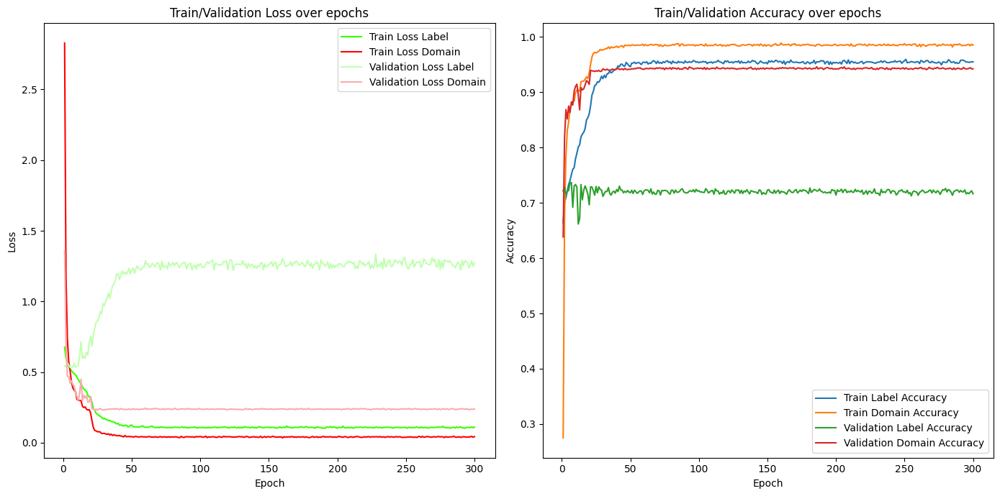

In [ ]:
# Graficar las métricas
plt.figure(figsize=(14, 7))

# Pérdidas
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), losses_label_train, label='Train Loss Label', color='#37ff00')
plt.plot(range(1, num_epochs+1), losses_domain_train, label='Train Loss Domain', color='#ff0000')
plt.plot(range(1, num_epochs+1), losses_label_val, label='Validation Loss Label', color='#c1ffb0')
plt.plot(range(1, num_epochs+1), losses_domain_val, label='Validation Loss Domain', color='#f7adad')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train/Validation Loss over epochs')
plt.legend()

# Accuracies
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), accuracies_label_train, label='Train Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_train, label='Train Domain Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_label_val, label='Validation Label Accuracy')
plt.plot(range(1, num_epochs+1), accuracies_domain_val, label='Validation Domain Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train/Validation Accuracy over epochs')
plt.legend()

plt.tight_layout()
plt.show()


In [25]:
!pip install PrettyTable

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 300 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 | 

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


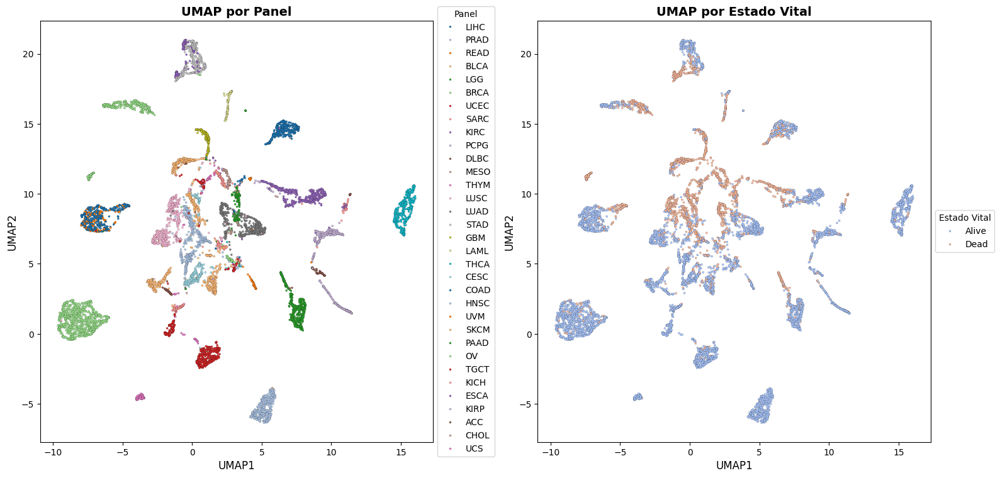

In [30]:
from prettytable import PrettyTable
from sklearn.decomposition import PCA
import umap


# Definir la función de visualización
def process_model_and_umap(df, epoch_to_load, layer_of_interest, device='cpu', batch_size=128):
    # Preparar los datos del DataFrame
    X = df.iloc[:, :-2].values  # Datos de las características (miRNAs u otras variables)
    Y = df['vital'].replace({'Alive': 1, 'Dead': 0}).values  # Estado vital
    panels = df['panel'].values  # Etiquetas del dominio (paneles)
    indices = df.index.values  # Mantener los índices originales como cadenas

    # Convertir la columna 'panel' a valores numéricos usando LabelEncoder
    label_encoder_panel = LabelEncoder()
    panels = label_encoder_panel.fit_transform(panels)

    # Normalizar los datos con el mismo scaler usado antes
    X = scaler.transform(X)

    # Convertir los datos en tensores para PyTorch
    X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
    Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
    panels_tensor = torch.tensor(panels, dtype=torch.long).to(device)

    # Crear el DataLoader
    dataset = TensorDataset(X_tensor, Y_tensor, panels_tensor)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    # Cargar el modelo de la época deseada
    model_path = os.path.join('model_checkpoints', f'model_epoch_{epoch_to_load}.pth')
    input_dim = X.shape[1]
    num_domains = len(label_encoder_panel.classes_)
    model = DANN(input_dim, num_domains).to(device)
    model.load_state_dict(torch.load(model_path))
    model.eval()

    # Mostrar información del modelo
    print(f"Modelo de la época {epoch_to_load} cargado exitosamente.\n")
    table = PrettyTable(["Nombre de la capa", "Tipo de capa", "Parámetros"])
    for name, layer in model.named_modules():
        num_params = sum(p.numel() for p in layer.parameters())
        if num_params > 0:
            table.add_row([name, layer.__class__.__name__, num_params])
    print(table)

    # Función para extraer características solo de las capas lineales
    def extract_features(model, loader, layer_name, indices, device):
        model.eval()
        features_list, labels_list, panels_list, indices_list = [], [], [], []

        with torch.no_grad():
            for i, (inputs, labels, domains) in enumerate(loader):
                inputs = inputs.to(device)

                # Extraer características de las capas lineales de interés
                if layer_name == 'feature_extractor.fc1':
                    features = model.feature_extractor.fc1(inputs)
                elif layer_name == 'label_predictor.fc1':
                    features = model.label_predictor.fc1(model.feature_extractor(inputs))
                elif layer_name == 'domain_classifier.fc1':
                    features = model.domain_classifier.fc1(model.feature_extractor(inputs))
                else:
                    raise ValueError(f"Capa no reconocida: {layer_name}")

                features_list.append(features.cpu().numpy())
                labels_list.append(labels.cpu().numpy())
                panels_list.append(domains.cpu().numpy())
                indices_list.append(indices[i * batch_size:(i + 1) * batch_size])

        all_features = np.concatenate(features_list, axis=0)
        all_labels = np.concatenate(labels_list, axis=0)
        all_panels = np.concatenate(panels_list, axis=0)
        all_indices = np.concatenate(indices_list, axis=0)

        return all_features, all_labels, all_panels, all_indices

    # Extraer características
    all_features, all_labels, all_panels, all_indices = extract_features(model, loader, layer_of_interest, indices, device)

    # Paso 1: Aplicar PCA para reducir las características a 50 componentes (opcional)
    print("Aplicando PCA...")
    pca = PCA(n_components=50)
    pca_result = pca.fit_transform(all_features)
    print(f"Dimensiones después de PCA: {pca_result.shape}")

    # Paso 2: Aplicar UMAP sobre los componentes reducidos por PCA
    def apply_umap(features):
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
        umap_coords = reducer.fit_transform(features)
        return umap_coords

    umap_coords = apply_umap(pca_result)

    # Crear DataFrame final
    df_umap = pd.DataFrame(umap_coords, columns=['UMAP1', 'UMAP2'])
    df_umap['vital_status'] = all_labels.flatten()
    df_umap['panel'] = all_panels
    df_umap['index'] = all_indices
    df_final = df_umap.merge(df, left_on='index', right_index=True)

    # Visualización con seaborn
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    sns.scatterplot(ax=axes[0], x='UMAP1', y='UMAP2', hue='panel_y', data=df_final,
                    palette='tab20', legend='full', s=5, edgecolor='black', linewidth=0.1)
    axes[0].set_title('UMAP por Panel', fontsize=14, weight='bold')
    axes[0].set_xlabel('UMAP1', fontsize=12)
    axes[0].set_ylabel('UMAP2', fontsize=12)
    axes[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Panel')

    sns.scatterplot(ax=axes[1], x='UMAP1', y='UMAP2', hue='vital', data=df_final,
                    palette='coolwarm', legend='full', s=5, edgecolor='black', linewidth=0.1)
    axes[1].set_title('UMAP por Estado Vital', fontsize=14, weight='bold')
    axes[1].set_xlabel('UMAP1', fontsize=12)
    axes[1].set_ylabel('UMAP2', fontsize=12)
    axes[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Estado Vital')

    plt.tight_layout()
    plt.show()

    return df_final[['UMAP1', 'UMAP2', 'index', 'vital', 'panel_y']]

# Uso de la función
# Especifica la capa de interés. Por ejemplo: 'label_predictor.fc1'
layer_of_interest = 'label_predictor.fc1'
# Especifica la época del modelo que deseas cargar
epoch_to_load = num_epochs  # Última época

# Procesar y visualizar
df_result = process_model_and_umap(df, epoch_to_load, layer_of_interest, device=device, batch_size=batch_size)

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 300 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 | 

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


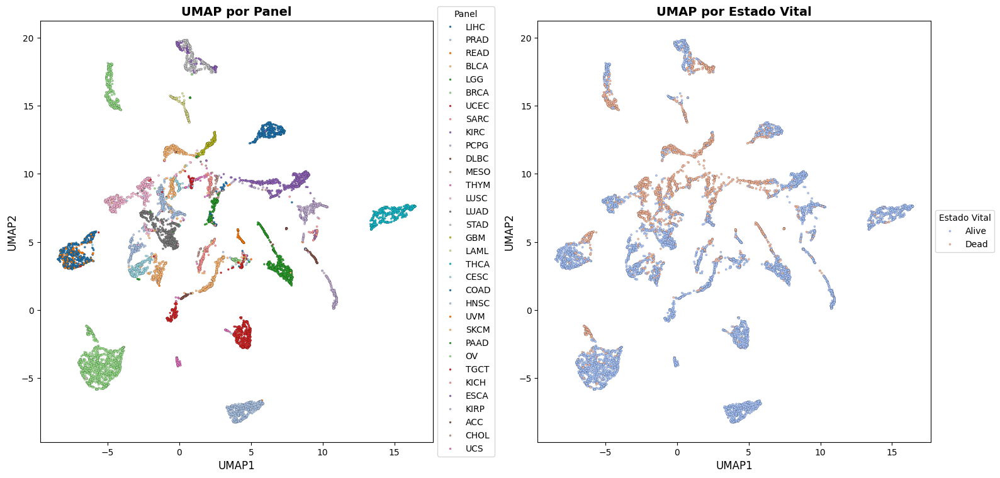

,UMAP1,UMAP2,index,vital,panel_y
0,7.314384,13.134437,9fe7d0f4-866d-490f-b2cb-d9be7da889de,Alive,LIHC
1,4.628765,-6.959364,dd74434f-300f-4798-8342-aad31b192e12,Alive,PRAD
2,-7.549911,4.869627,07db9e9d-059d-4e6c-b483-81517a492b96,Dead,READ
3,7.154583,13.379821,47ee860a-fd18-48f2-bfe7-4e19391950bd,Alive,LIHC
4,-0.561468,9.470979,e322b0e5-458a-4cbf-a64f-9b348e413939,Dead,BLCA
...,...,...,...,...,...
10281,6.371133,9.485146,62cb41b1-8960-4fa2-8f74-38dd174af004,Dead,KIRC
10282,3.209384,-1.454651,673a85f3-ba5e-448a-acee-dfec77b5238e,Alive,UCS
10283,7.222269,2.457350,3d93b2ae-7730-4914-af23-ff3554752922,Alive,LGG
10284,-0.500559,15.617616,85a0b88f-2b89-4117-9e04-b81fad7f2e1b,Alive,LAML


In [31]:

# Uso de la función
# Especifica la capa de interés. Por ejemplo: 'label_predictor.fc1'
layer_of_interest = 'label_predictor.fc1'
# Especifica la época del modelo que deseas cargar
epoch_to_load = 300  # Última época

# Procesar y visualizar
df_result = process_model_and_umap(df, epoch_to_load, layer_of_interest, device=device, batch_size=batch_size)
df_result

In [32]:
!pip install prettytable

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 1 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 |   

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


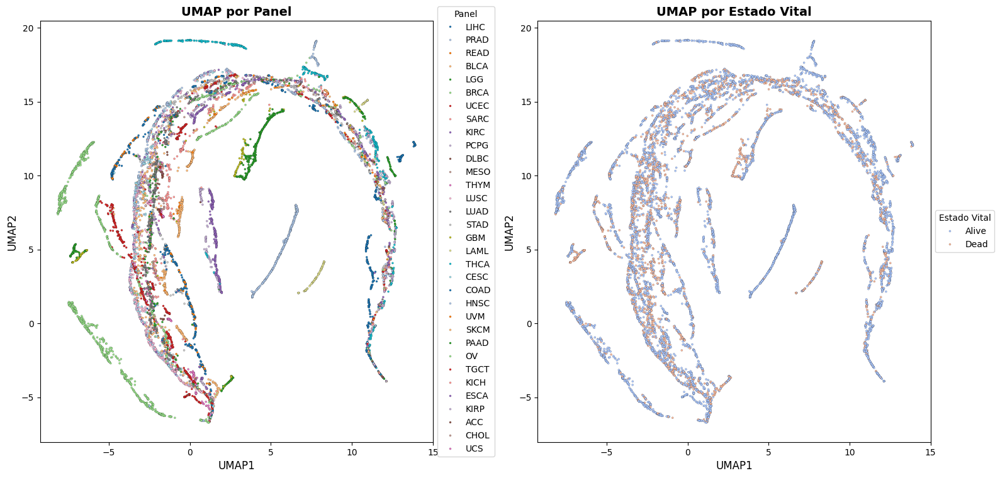

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 10 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 |  

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


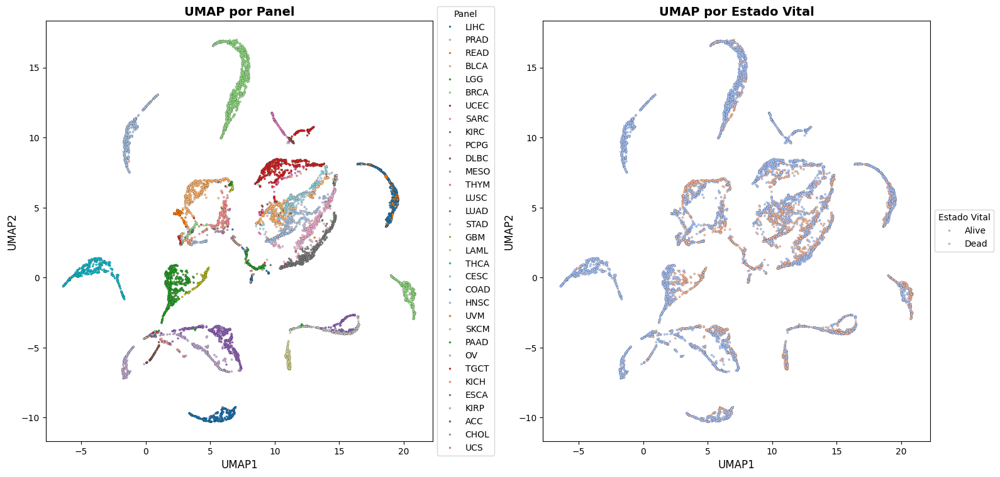

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 20 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 |  

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


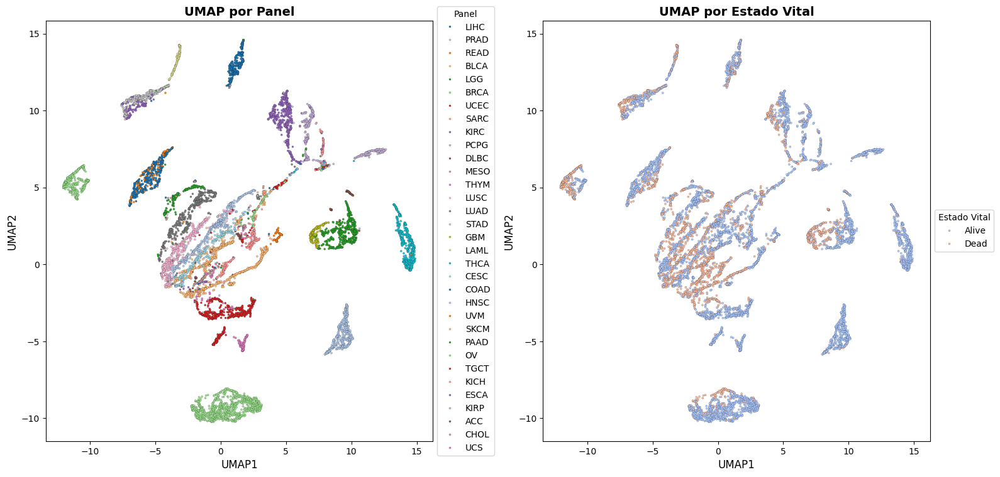

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 30 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 |  

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


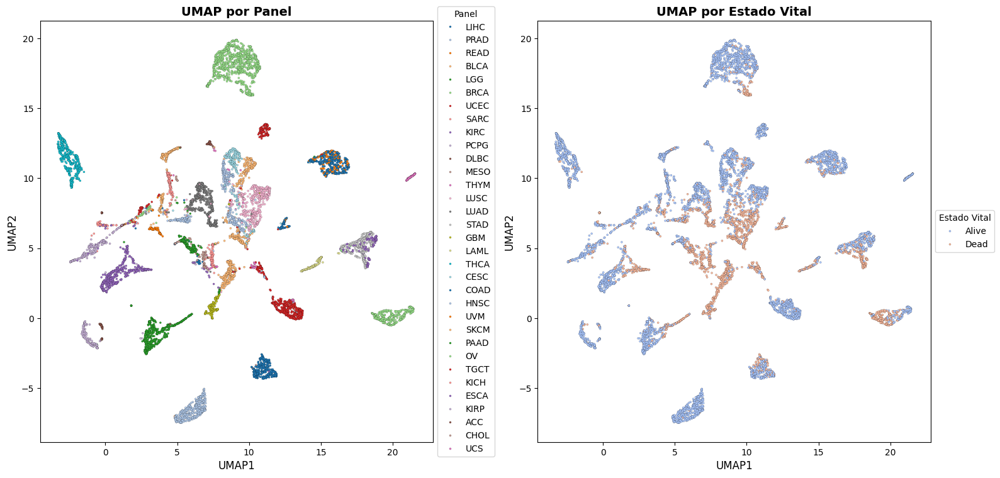

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 50 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 |  

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


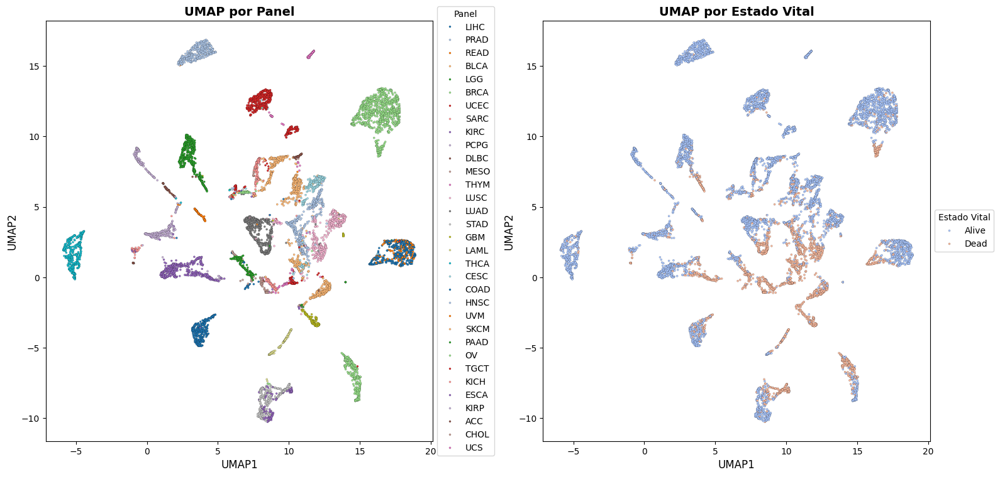

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 100 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 | 

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


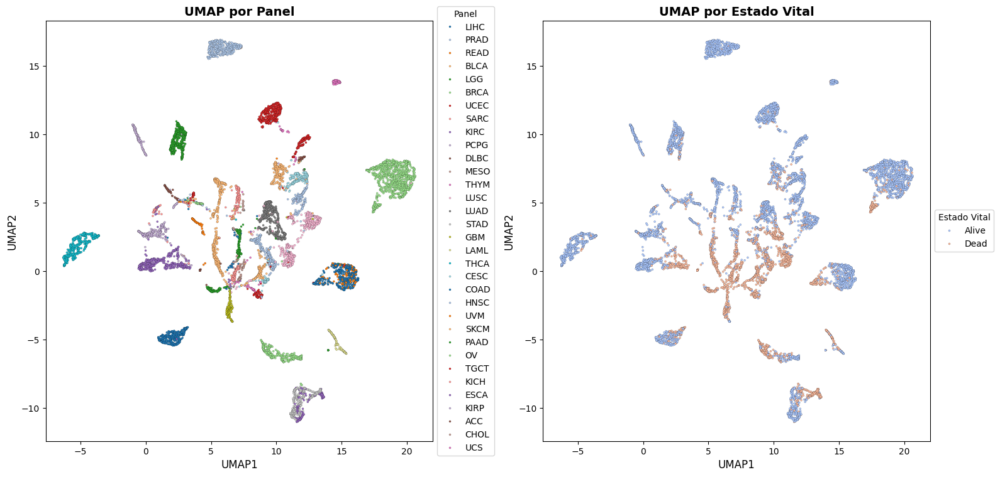

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 200 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 | 

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


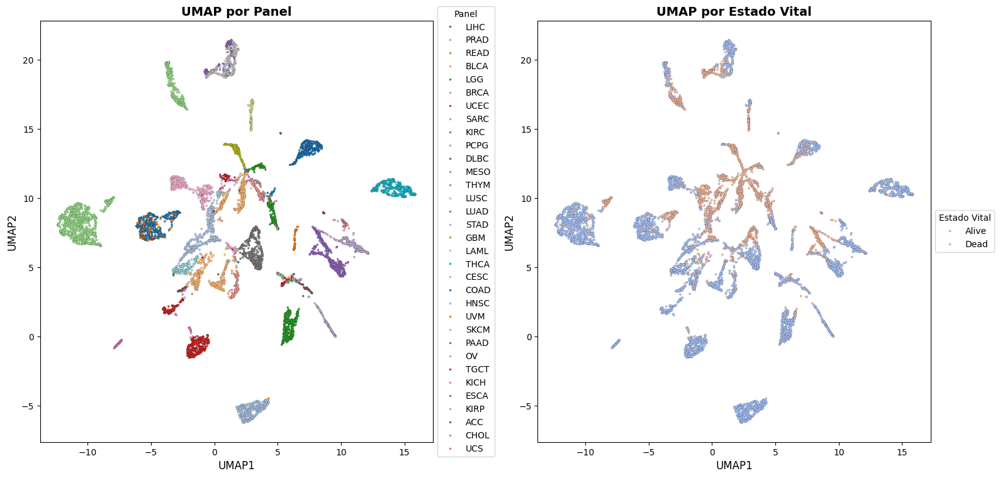

<ipython-input-30-7bfca495c00e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Modelo de la época 300 cargado exitosamente.

+-----------------------+------------------+------------+
|   Nombre de la capa   |   Tipo de capa   | Parámetros |
+-----------------------+------------------+------------+
|                       |       DANN       |  43025034  |
|   feature_extractor   | FeatureExtractor |  40985000  |
| feature_extractor.fc1 |      Linear      |  39980000  |
| feature_extractor.bn1 |   BatchNorm1d    |    2000    |
| feature_extractor.fc2 |      Linear      |  1001000   |
| feature_extractor.bn2 |   BatchNorm1d    |    2000    |
|    label_predictor    |  LabelPredictor  |  1004001   |
|  label_predictor.fc1  |      Linear      |  1001000   |
|  label_predictor.bn1  |   BatchNorm1d    |    2000    |
|  label_predictor.fc2  |      Linear      |    1001    |
|   domain_classifier   | DomainClassifier |  1036033   |
| domain_classifier.fc1 |      Linear      |  1001000   |
| domain_classifier.bn1 |   BatchNorm1d    |    2000    |
| domain_classifier.fc2 | 

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


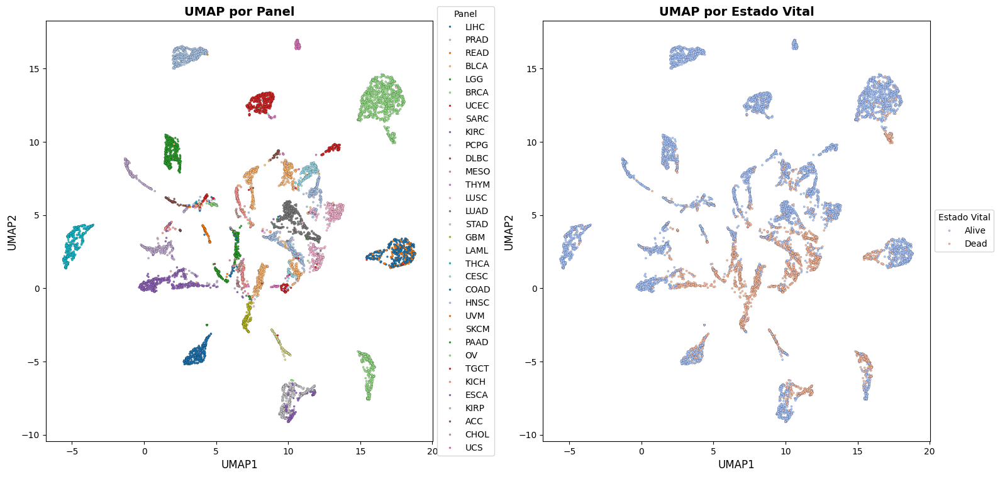

In [33]:
# Lista para guardar los DataFrames
dataframes_list = []

# Ciclo iterativo de 1 a 30
for i in [1,10,20,30,50,100,200,300]:#range(49, 50):
    df_coords = process_model_and_umap(df, epoch_to_load=i, layer_of_interest='label_predictor.fc1', device='cuda', batch_size=batch_size)
    df_coords['epochs'] = i
    dataframes_list.append(df_coords)




In [34]:
final_df = pd.concat(dataframes_list, ignore_index=True)
final_df

,UMAP1,UMAP2,index,vital,panel_y,epochs
0,11.484472,8.476844,9fe7d0f4-866d-490f-b2cb-d9be7da889de,Alive,LIHC,1
1,5.941959,5.722904,dd74434f-300f-4798-8342-aad31b192e12,Alive,PRAD,1
2,1.049575,-4.073879,07db9e9d-059d-4e6c-b483-81517a492b96,Dead,READ,1
3,11.254480,3.341726,47ee860a-fd18-48f2-bfe7-4e19391950bd,Alive,LIHC,1
4,-2.530845,-1.170437,e322b0e5-458a-4cbf-a64f-9b348e413939,Dead,BLCA,1
...,...,...,...,...,...,...
82283,2.472422,0.044387,62cb41b1-8960-4fa2-8f74-38dd174af004,Dead,KIRC,300
82284,8.851104,11.637657,673a85f3-ba5e-448a-acee-dfec77b5238e,Alive,UCS,300
82285,1.493565,9.529890,3d93b2ae-7730-4914-af23-ff3554752922,Alive,LGG,300
82286,10.019555,-4.464580,85a0b88f-2b89-4117-9e04-b81fad7f2e1b,Alive,LAML,300


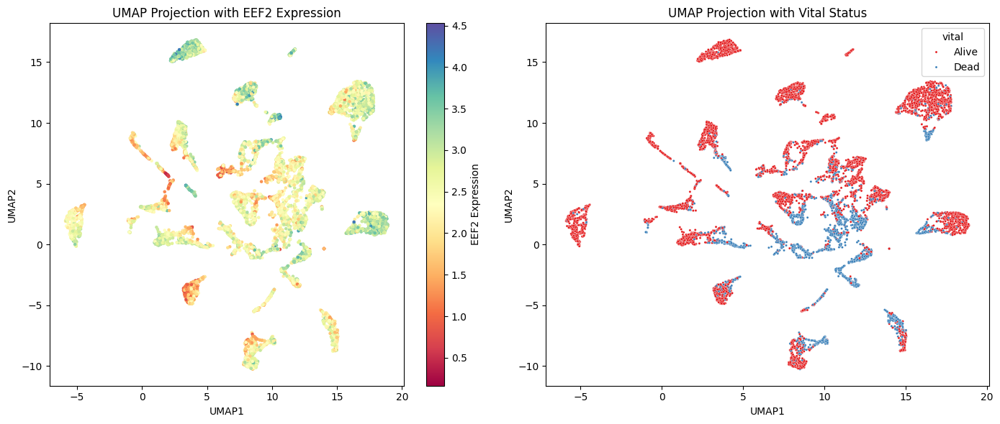

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
import umap
import pandas as pd
import numpy as np  # Asegúrate de importar numpy

# Supongo que df es el DataFrame original, si no, ajusta este nombre
df_VIS = final_df[final_df['epochs'] == 50].set_index('index').copy()

# Añadir una columna log-transformada de 'EEF2'
df_VIS['EEF2'] = np.log(df['EEF2'] + 1)
df_VIS['vital'] = df['vital']  # Dejar 'vital' como string

# Crear una figura con dos subplots (1 fila, 2 columnas)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Primera gráfica: UMAP con EEF2 como color
scatter1 = axes[0].scatter(
    x=df_VIS['UMAP1'],
    y=df_VIS['UMAP2'],
    c=df_VIS['EEF2'],
    cmap='Spectral',
    s=5
)
axes[0].set_title('UMAP Projection with EEF2 Expression')
axes[0].set_xlabel('UMAP1')
axes[0].set_ylabel('UMAP2')

# Añadir la barra de color para la primera gráfica
cbar1 = fig.colorbar(scatter1, ax=axes[0])
cbar1.set_label('EEF2 Expression')

# Segunda gráfica: UMAP con 'vital' como color categórico usando Seaborn
sns.scatterplot(
    x='UMAP1',
    y='UMAP2',
    hue='vital',
    palette='Set1',  # Puedes cambiar la paleta si lo prefieres
    data=df_VIS,
    ax=axes[1],
    s=5
)
axes[1].set_title('UMAP Projection with Vital Status')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')

# Mostrar ambas gráficas
plt.tight_layout()
plt.show()


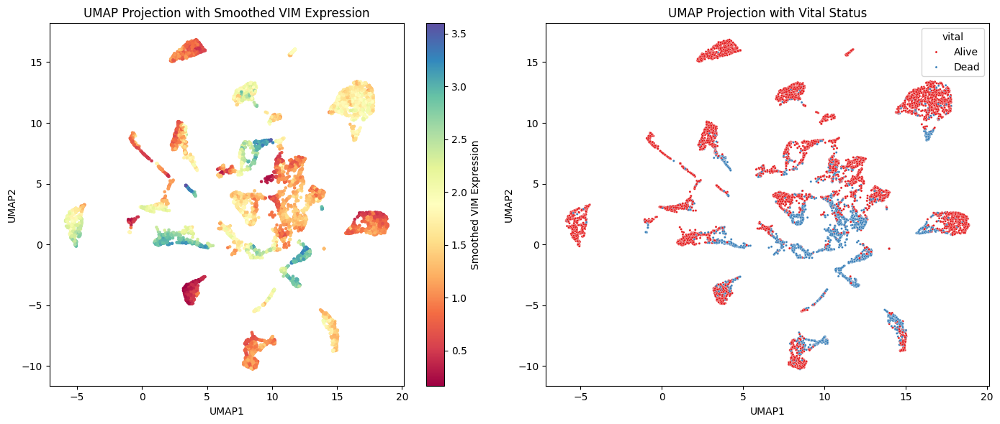

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import umap
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors  # Para calcular los vecinos más cercanos

# Variable para cambiar rápidamente el gen a visualizar
gene_to_plot = 'VIM'  # Cambia esto al gen que quieras visualizar

# Supongo que df es el DataFrame original, si no, ajusta este nombre
df_VIS = final_df[final_df['epochs'] == 50].set_index('index').copy()

# Añadir una columna log-transformada del gen seleccionado
df_VIS[gene_to_plot] = np.log(df[gene_to_plot] + 1)
df_VIS['vital'] = df['vital']  # Dejar 'vital' como string

# Obtener las coordenadas UMAP
coordinates = df_VIS[['UMAP1', 'UMAP2']].values

# Suavizado utilizando los vecinos más cercanos
n_neighbors = 10  # Número de vecinos para el suavizado
nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(coordinates)
distances, indices = nbrs.kneighbors(coordinates)

# Promediar la expresión génica de los vecinos más cercanos
smoothed_expression = np.zeros(df_VIS[gene_to_plot].shape)
for i, neighbors in enumerate(indices):
    smoothed_expression[i] = np.mean(df_VIS.iloc[neighbors][gene_to_plot])

# Asignar la expresión suavizada al DataFrame
df_VIS[f'{gene_to_plot}_smoothed'] = smoothed_expression

# Crear una figura con dos subplots (1 fila, 2 columnas)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Primera gráfica: UMAP con la expresión suavizada del gen seleccionado
scatter1 = axes[0].scatter(
    x=df_VIS['UMAP1'],
    y=df_VIS['UMAP2'],
    c=df_VIS[f'{gene_to_plot}_smoothed'],
    cmap='Spectral',
    s=5
)
axes[0].set_title(f'UMAP Projection with Smoothed {gene_to_plot} Expression')
axes[0].set_xlabel('UMAP1')
axes[0].set_ylabel('UMAP2')

# Añadir la barra de color para la primera gráfica
cbar1 = fig.colorbar(scatter1, ax=axes[0])
cbar1.set_label(f'Smoothed {gene_to_plot} Expression')

# Segunda gráfica: UMAP con 'vital' como color categórico usando Seaborn
sns.scatterplot(
    x='UMAP1',
    y='UMAP2',
    hue='vital',
    palette='Set1',  # Puedes cambiar la paleta si lo prefieres
    data=df_VIS,
    ax=axes[1],
    s=5
)
axes[1].set_title('UMAP Projection with Vital Status')
axes[1].set_xlabel('UMAP1')
axes[1].set_ylabel('UMAP2')

# Mostrar ambas gráficas
plt.tight_layout()
plt.show()


In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
import umap
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors  # Para calcular los vecinos más cercanos

def plot_umap_with_gene_expression(df, df_VIS, gene_to_plot, smooth=False, n_neighbors=10):
    """
    Función para graficar proyecciones UMAP con la expresión génica, con opción de suavizado.

    Parameters:
    - df: DataFrame con las expresiones génicas (original).
    - df_VIS: DataFrame con las coordenadas UMAP y otros datos.
    - gene_to_plot: String con el nombre del gen a visualizar.
    - smooth: Booleano que indica si se aplica suavizado a la expresión génica (por vecinos cercanos).
    - n_neighbors: Número de vecinos cercanos para el suavizado.
    """

    # Verificar si la columna del gen está en el DataFrame original
    if gene_to_plot not in df.columns:
        raise KeyError(f"Error: La columna '{gene_to_plot}' no existe en el DataFrame 'df'.")

    # Añadir una columna log-transformada del gen seleccionado al DataFrame de visualización (df_VIS)
    df_VIS[gene_to_plot] = np.log(df[gene_to_plot] + 1)  # Tomar la columna del df original
    df_VIS['vital'] = df['vital']  # Asegurarse de que la columna 'vital' también esté en df_VIS

    # Obtener las coordenadas UMAP de df_VIS
    coordinates = df_VIS[['UMAP1', 'UMAP2']].values

    # Si se selecciona suavizado
    if smooth:
        nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(coordinates)
        distances, indices = nbrs.kneighbors(coordinates)

        # Promediar la expresión génica de los vecinos más cercanos
        smoothed_expression = np.zeros(df_VIS[gene_to_plot].shape)
        for i, neighbors in enumerate(indices):
            smoothed_expression[i] = np.mean(df_VIS.iloc[neighbors][gene_to_plot])
        df_VIS[f'{gene_to_plot}_smoothed'] = smoothed_expression
        expression_column = f'{gene_to_plot}_smoothed'
    else:
        expression_column = gene_to_plot

    # Crear una figura con dos subplots (1 fila, 2 columnas)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Primera gráfica: UMAP con la expresión del gen seleccionado (suavizada o no)
    scatter1 = axes[0].scatter(
        x=df_VIS['UMAP1'],
        y=df_VIS['UMAP2'],
        c=df_VIS[expression_column],
        cmap='Spectral',
        s=5
    )
    axes[0].set_title(f'UMAP Projection with {expression_column} Expression')
    axes[0].set_xlabel('UMAP1')
    axes[0].set_ylabel('UMAP2')

    # Añadir la barra de color para la primera gráfica
    cbar1 = fig.colorbar(scatter1, ax=axes[0])
    cbar1.set_label(f'{expression_column} Expression')

    # Segunda gráfica: UMAP con 'vital' como color categórico usando Seaborn
    sns.scatterplot(
        x='UMAP1',
        y='UMAP2',
        hue='vital',
        palette='Set1',  # Puedes cambiar la paleta si lo prefieres
        data=df_VIS,
        ax=axes[1],
        s=5
    )
    axes[1].set_title('UMAP Projection with Vital Status')
    axes[1].set_xlabel('UMAP1')
    axes[1].set_ylabel('UMAP2')

    # Mostrar ambas gráficas
    plt.tight_layout()
    plt.show()



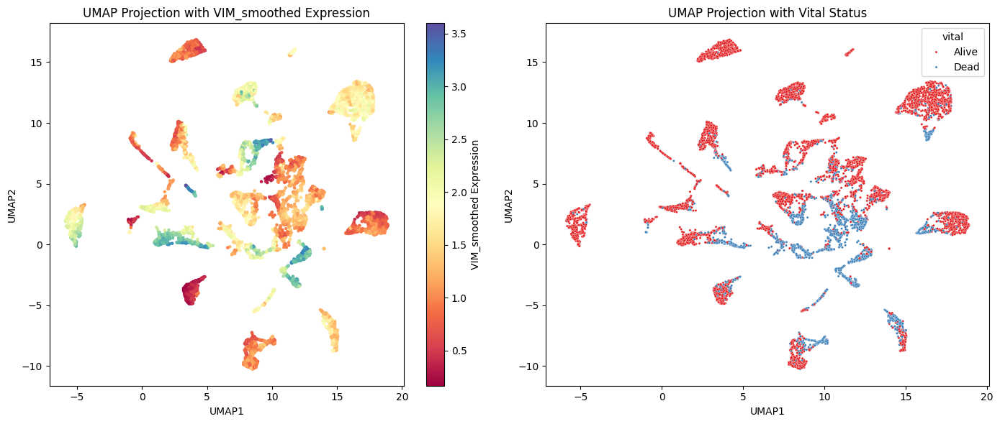

In [38]:
# Supongo que df es el DataFrame original con las expresiones génicas
# y df_VIS contiene las coordenadas UMAP y otras variables
df_VIS = final_df[final_df['epochs'] == 50].set_index('index').copy()

# Llamar a la función con ambos DataFrames y suavizado o sin suavizado
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='VIM', smooth=True, n_neighbors=10)


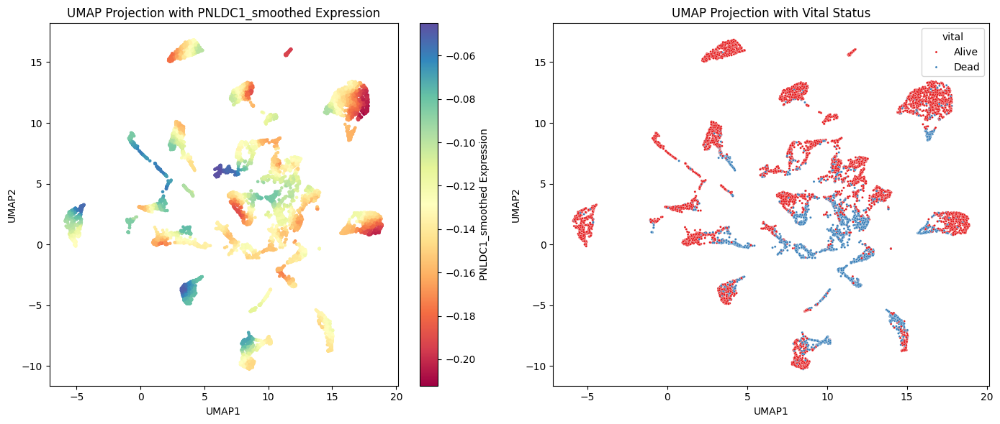

In [41]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='PNLDC1', smooth=True, n_neighbors=100)


In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='PNLDC1', smooth=True, n_neighbors=100)


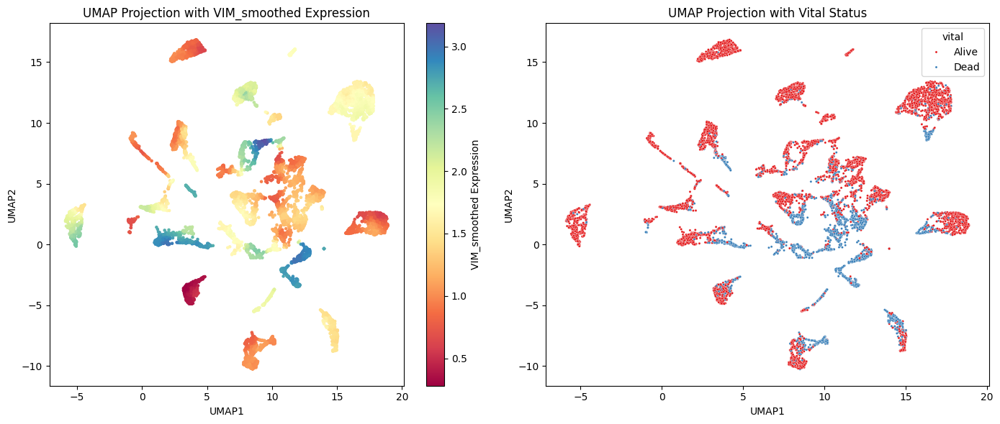

In [39]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='VIM', smooth=True, n_neighbors=100)


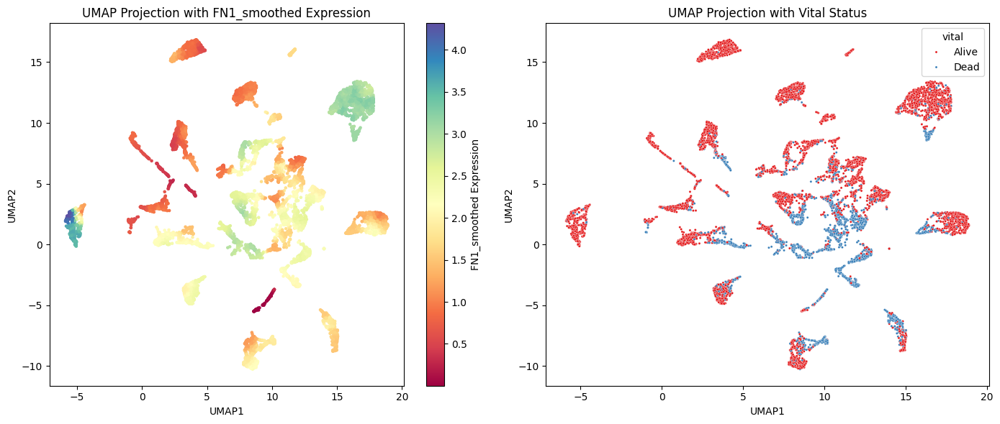

In [40]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='FN1', smooth=True, n_neighbors=100)


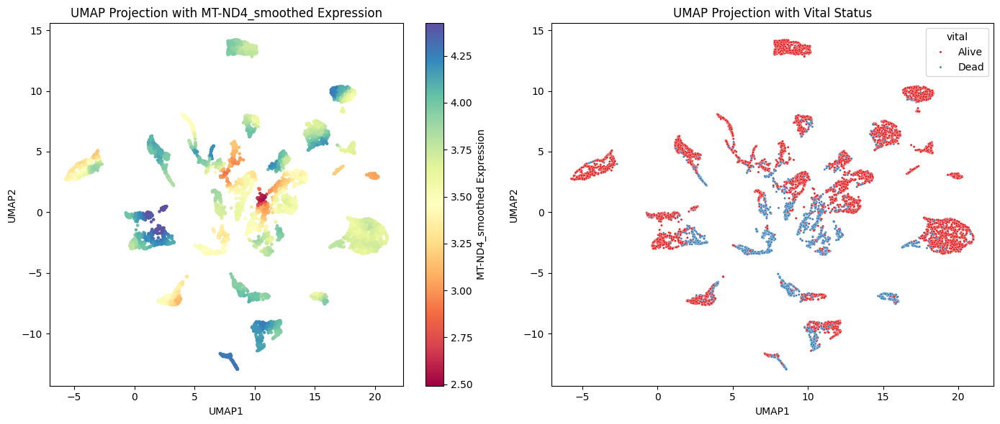

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='MT-ND4', smooth=True, n_neighbors=100)


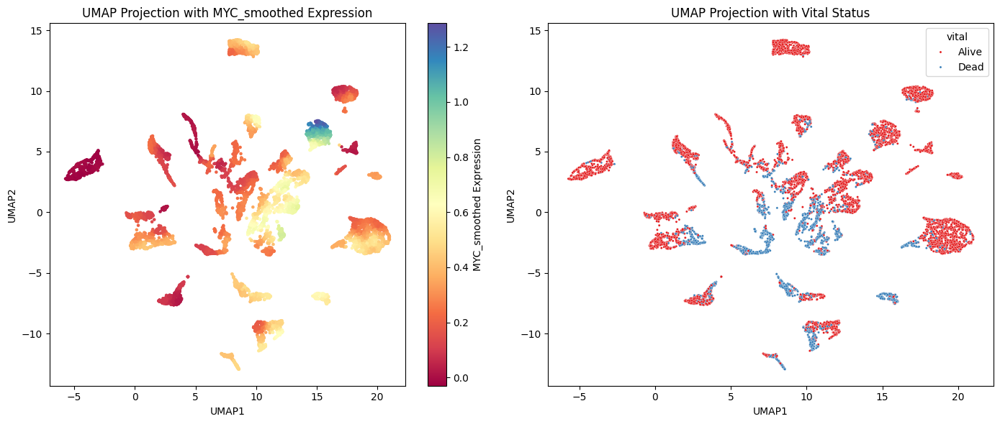

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='MYC', smooth=True, n_neighbors=100)


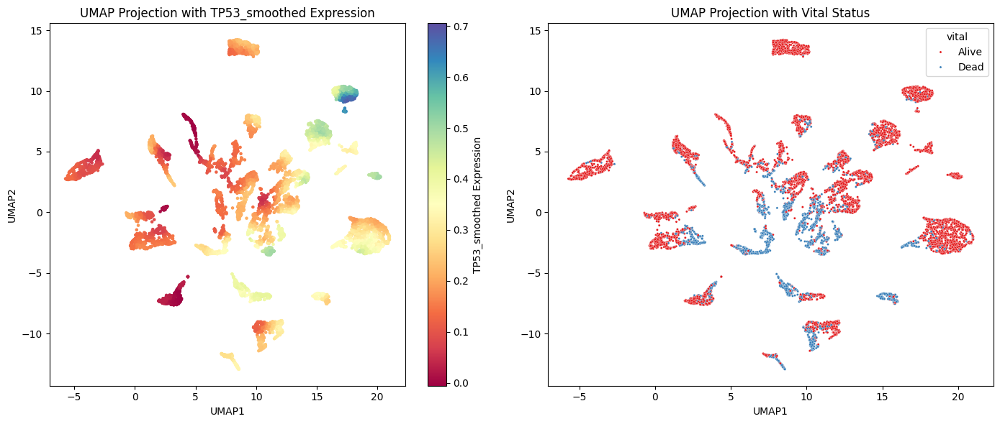

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='TP53', smooth=True, n_neighbors=100)


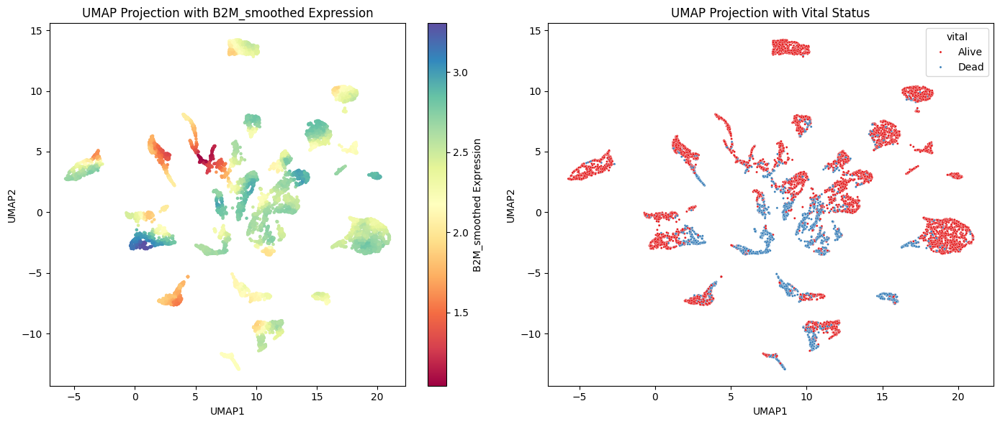

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='B2M', smooth=True, n_neighbors=100)


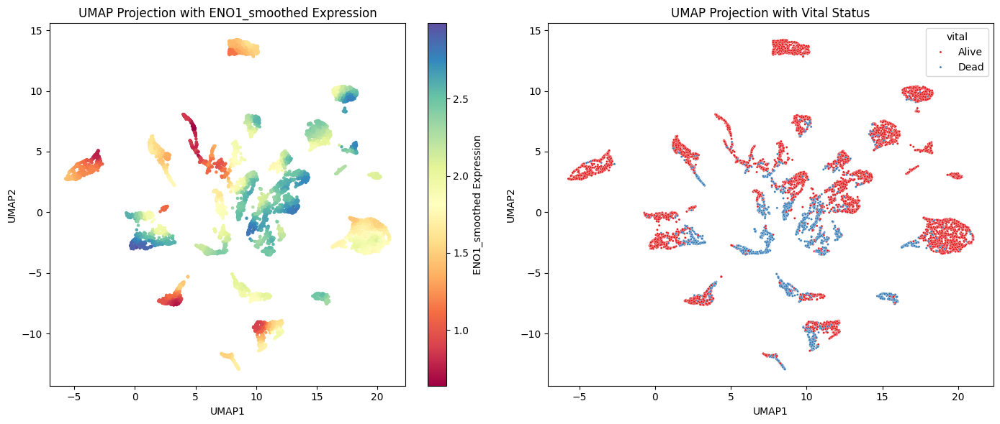

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='ENO1', smooth=True, n_neighbors=100)


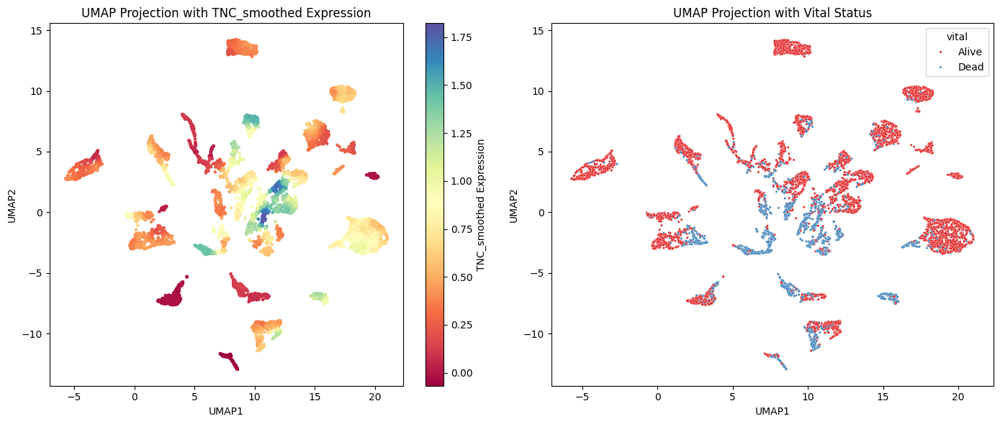

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='TNC', smooth=True, n_neighbors=100)


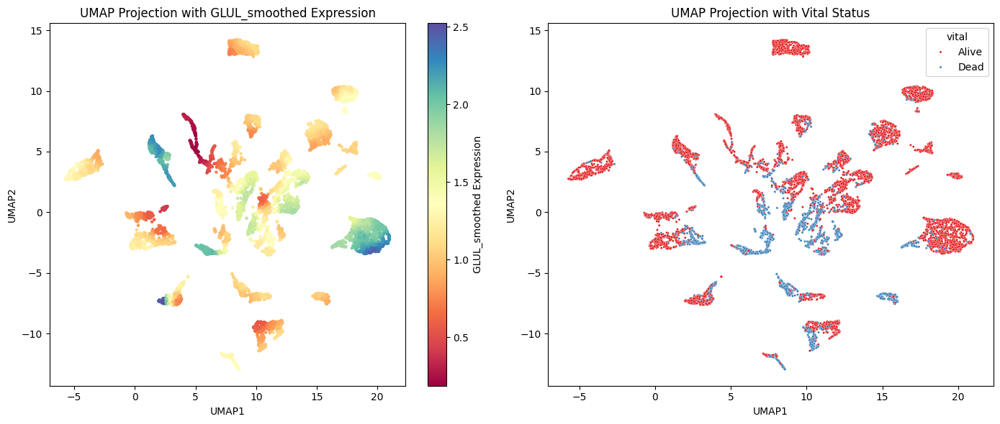

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='GLUL', smooth=True, n_neighbors=100)


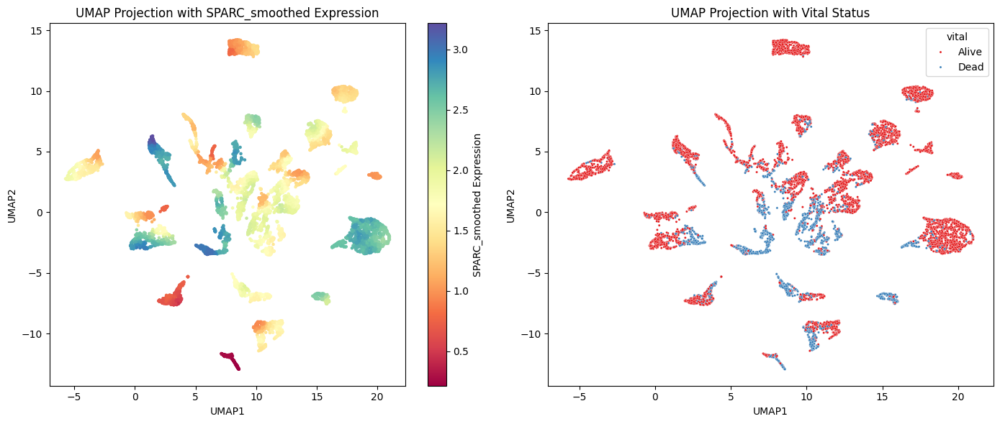

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='SPARC', smooth=True, n_neighbors=100)


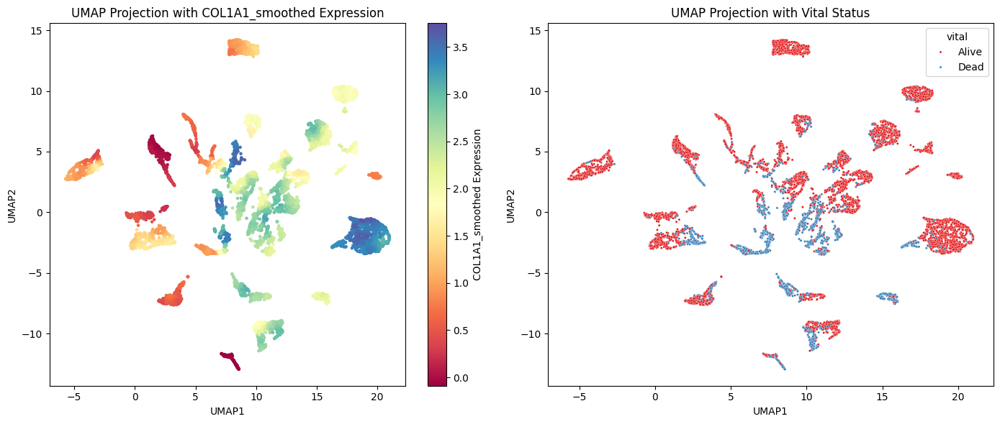

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='COL1A1', smooth=True, n_neighbors=100)


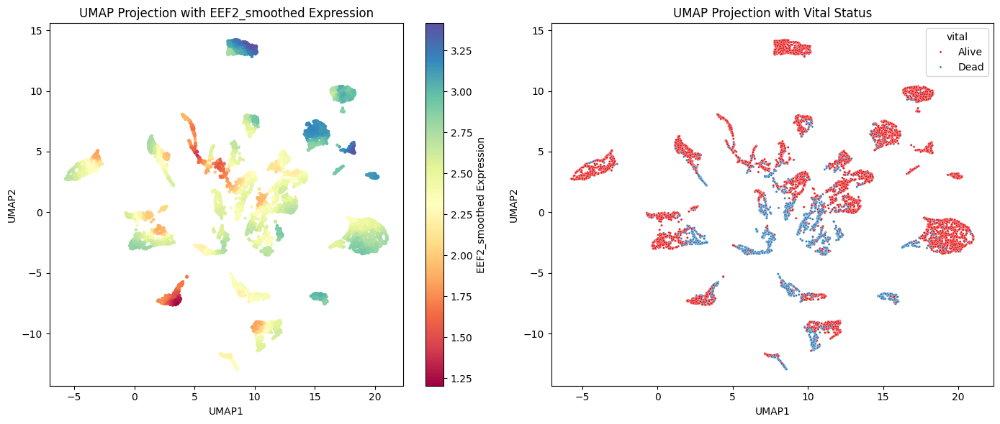

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='EEF2', smooth=True, n_neighbors=100)


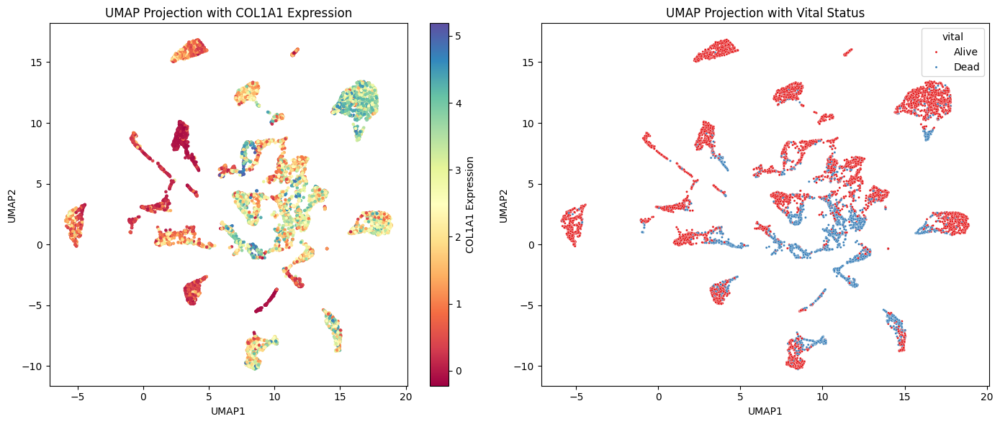

In [48]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='COL1A1', smooth=False, n_neighbors=100)


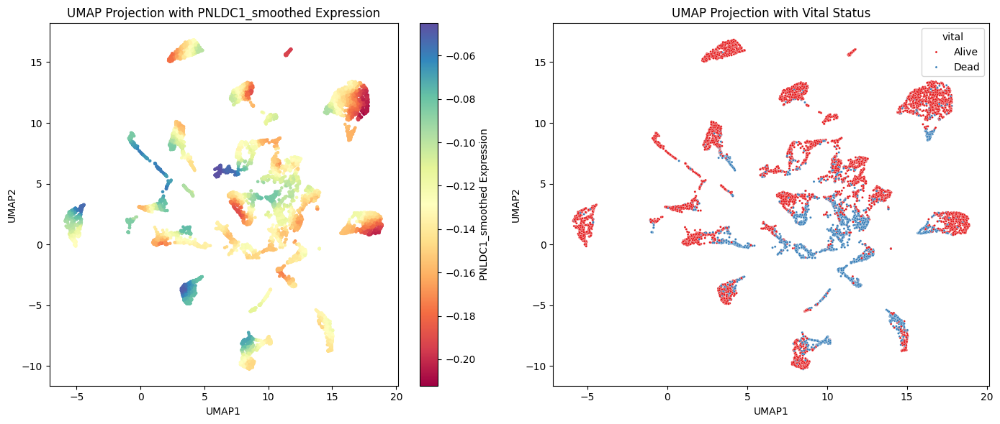

In [49]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='PNLDC1', smooth=True, n_neighbors=100)


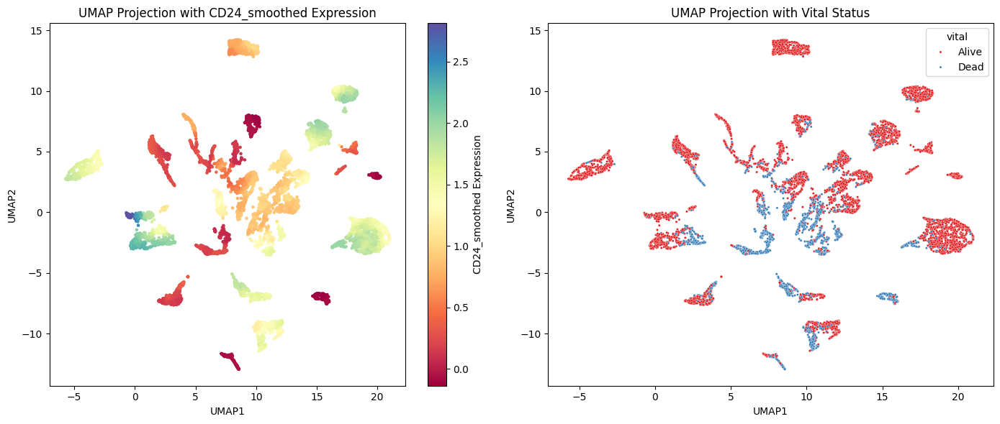

In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='CD24', smooth=True, n_neighbors=100)


In [ ]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='ZFPM2-AS1', smooth=False, n_neighbors=100)


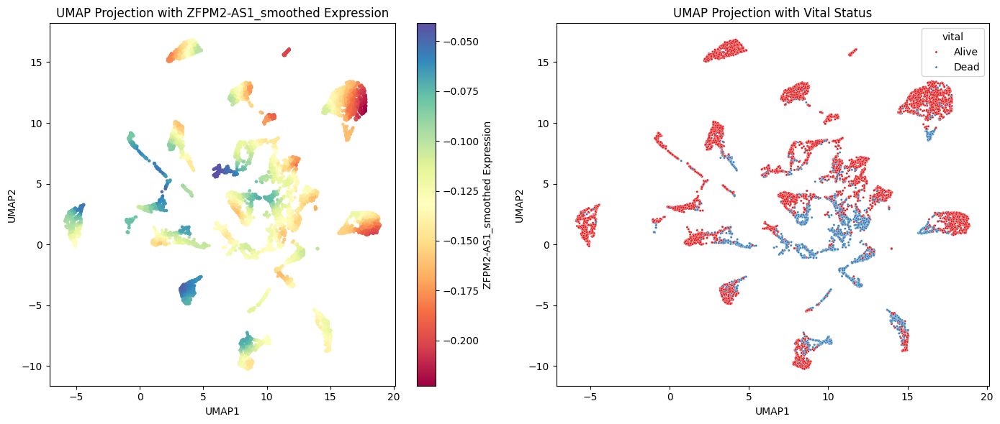

In [42]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='ZFPM2-AS1', smooth=True, n_neighbors=100)


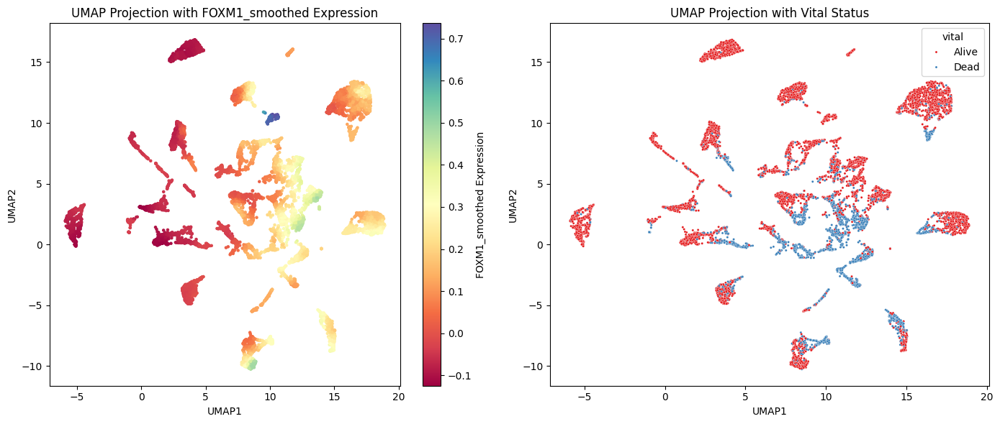

In [43]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='FOXM1', smooth=True, n_neighbors=100)

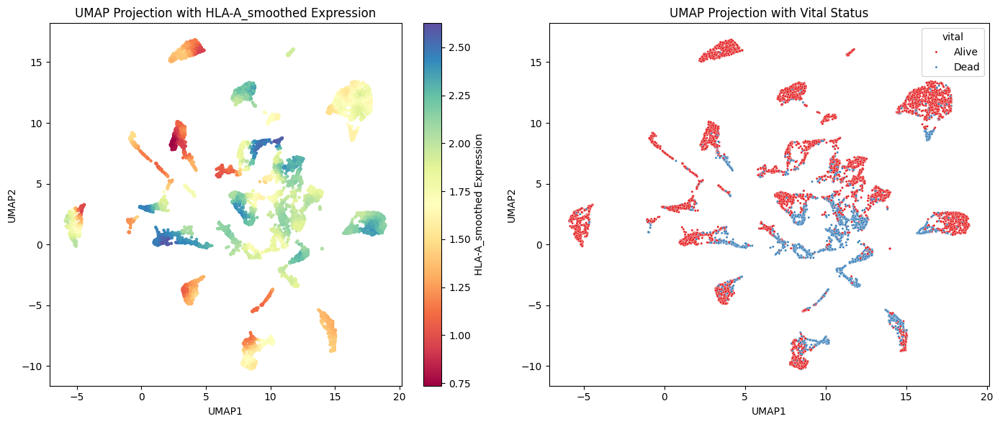

In [44]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='HLA-A', smooth=True, n_neighbors=100)

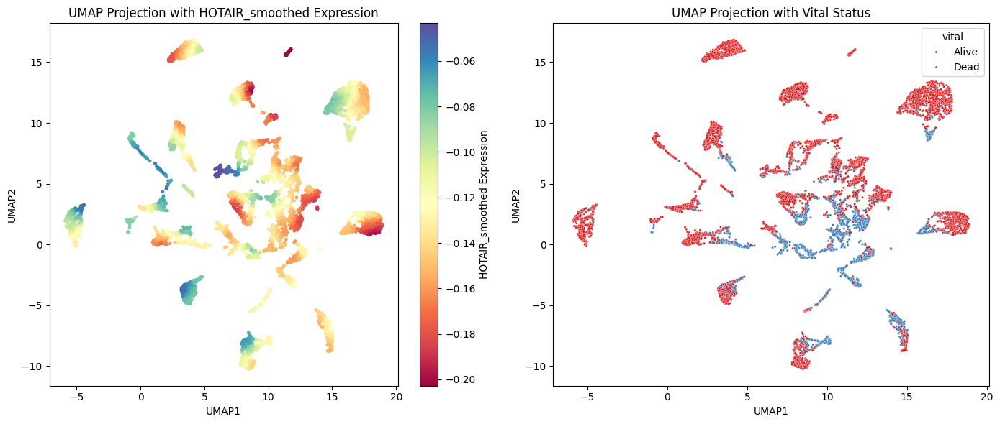

In [46]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='HOTAIR', smooth=True, n_neighbors=100)

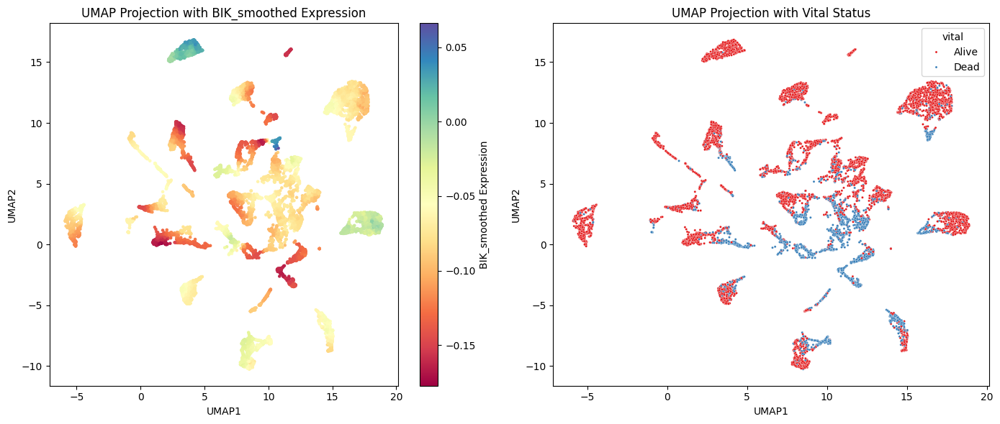

In [47]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='BIK', smooth=True, n_neighbors=100)

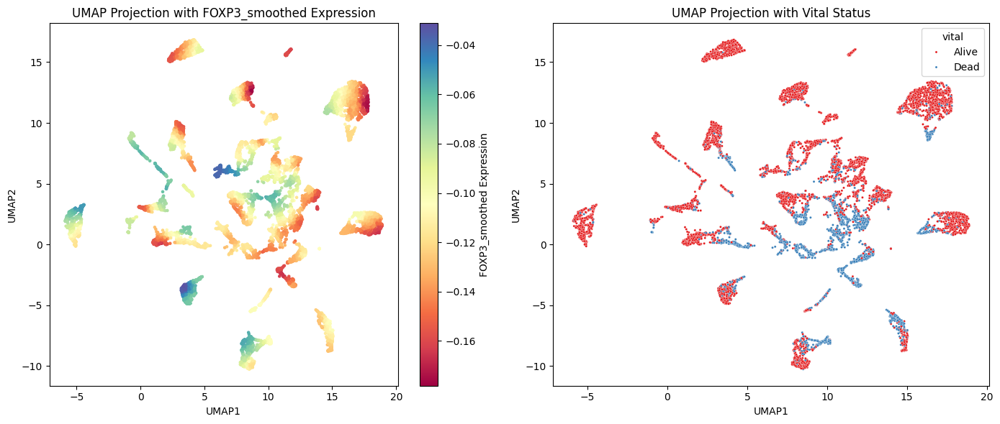

In [45]:
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='FOXP3', smooth=True, n_neighbors=100)

<ipython-input-19-f8940104e6d1>:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


Modelo de la época 50 cargado exitosamente.
Calculando los valores SHAP...
Forma final del array de valores SHAP: (10286, 39979)
Forma de X_sample: (10286, 39979)
Generando el gráfico resumen de SHAP...


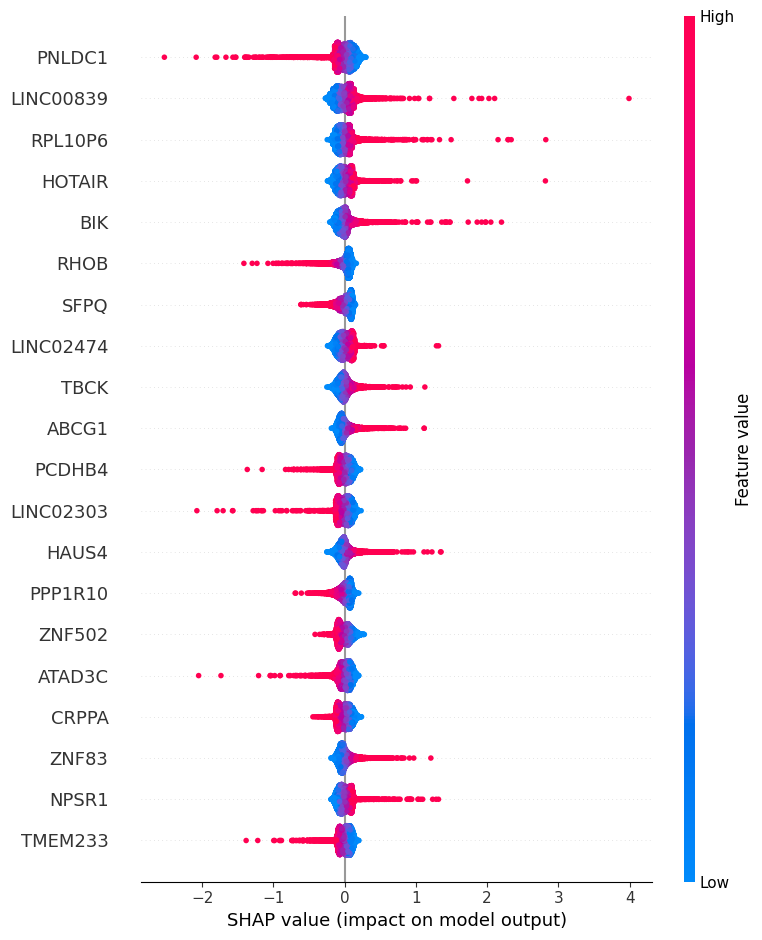

Gráfico de resumen de SHAP generado exitosamente.


In [19]:
import os
import torch
import pandas as pd
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import LabelEncoder
import shap
from tqdm import tqdm
import numpy as np

# Asegúrate de que las clases FeatureExtractor, LabelPredictor, DomainClassifier, ReverseLayerF y DANN
# están definidas exactamente como en tu código original que no puede ser cambiado.
# No las redefiniremos aquí; asumimos que ya están definidas y disponibles en tu entorno.

# Función para cargar el modelo y preparar los datos
def process_model_and_data(df, epoch_to_load, device='cpu', batch_size=128):
    # Preparar los datos del DataFrame
    X = df.iloc[:, :-2].values  # Datos de las características
    Y = df['vital'].replace({'Alive': 1, 'Dead': 0}).values  # Estado vital (Alive = 1, Dead = 0)
    panels = df['panel'].values  # Etiquetas del dominio (paneles)


    # Normalizar los datos
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    X = scaler.fit_transform(X)


    # Convertir la columna 'panel' a valores numéricos usando LabelEncoder
    label_encoder_panel = LabelEncoder()
    panels = label_encoder_panel.fit_transform(panels)

    # Convertir los datos en tensores para PyTorch
    X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
    Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
    panels_tensor = torch.tensor(panels, dtype=torch.long).to(device)

    # Crear el DataLoader
    dataset = TensorDataset(X_tensor, Y_tensor, panels_tensor)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    # Cargar el modelo de la época deseada
    model_path = os.path.join('model_checkpoints', f'model_epoch_{epoch_to_load}.pth')
    input_dim = X.shape[1]
    num_domains = len(label_encoder_panel.classes_)  # Número de paneles (dominios)

    # Definir el modelo DANN exactamente como en tu código
    model = DANN(input_dim, num_domains).to(device)

    # Cargar los pesos del modelo
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()  # Poner el modelo en modo de evaluación

    print(f"Modelo de la época {epoch_to_load} cargado exitosamente.")

    return model, loader, X_tensor

# Especificar la época que deseas cargar
epoch_to_load = 50  # Cambia este número a la época que desees
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Procesar el modelo y los datos
model, loader, X_tensor = process_model_and_data(df, epoch_to_load, device)

# Asegurarse de que el modelo está en el dispositivo correcto y en modo evaluación
model.to(device)
model.eval()

# Definir el modelo combinado que incluye el FeatureExtractor y LabelPredictor
class CombinedModel(torch.nn.Module):
    def __init__(self, feature_extractor, label_predictor):
        super(CombinedModel, self).__init__()
        self.feature_extractor = feature_extractor
        self.label_predictor = label_predictor

    def forward(self, x):
        # Pasar a través del FeatureExtractor
        features = self.feature_extractor(x)
        # Pasar las características extraídas al LabelPredictor
        label_output, _ = self.label_predictor(features)
        return label_output

# Crear una instancia del modelo combinado
combined_model = CombinedModel(model.feature_extractor, model.label_predictor).to(device)
combined_model.eval()

# Seleccionar una muestra de los datos si es necesario
X_sample = X_tensor[:]  # Por ejemplo, las primeras 100 muestras

# Crear el GradientExplainer de SHAP con el modelo combinado y los datos
explainer = shap.GradientExplainer(combined_model, X_sample)

# Calcular los valores SHAP para las instancias en X_sample
print("Calculando los valores SHAP...")
try:
    # Calcular los valores SHAP para todas las muestras a la vez
    shap_values = explainer.shap_values(X_sample)

    # Manejar múltiples salidas en caso de que shap_values sea una lista
    if isinstance(shap_values, list):
        shap_values_np = shap_values[0]
    else:
        shap_values_np = shap_values

    # Aplicar squeeze para eliminar dimensiones extra de tamaño 1
    shap_values_np = np.squeeze(shap_values_np)
    X_sample_np = np.squeeze(X_sample.cpu().numpy())

    print("Forma final del array de valores SHAP:", shap_values_np.shape)
    print("Forma de X_sample:", X_sample_np.shape)

    # Utilizar los nombres originales de las características
    feature_names_original = df.columns[:-2]

    # Generar el gráfico resumen de SHAP
    print("Generando el gráfico resumen de SHAP...")
    shap.summary_plot(shap_values_np, X_sample_np, feature_names=feature_names_original)
    print("Gráfico de resumen de SHAP generado exitosamente.")

except Exception as e:
    print(f"Ocurrió un error: {e}")


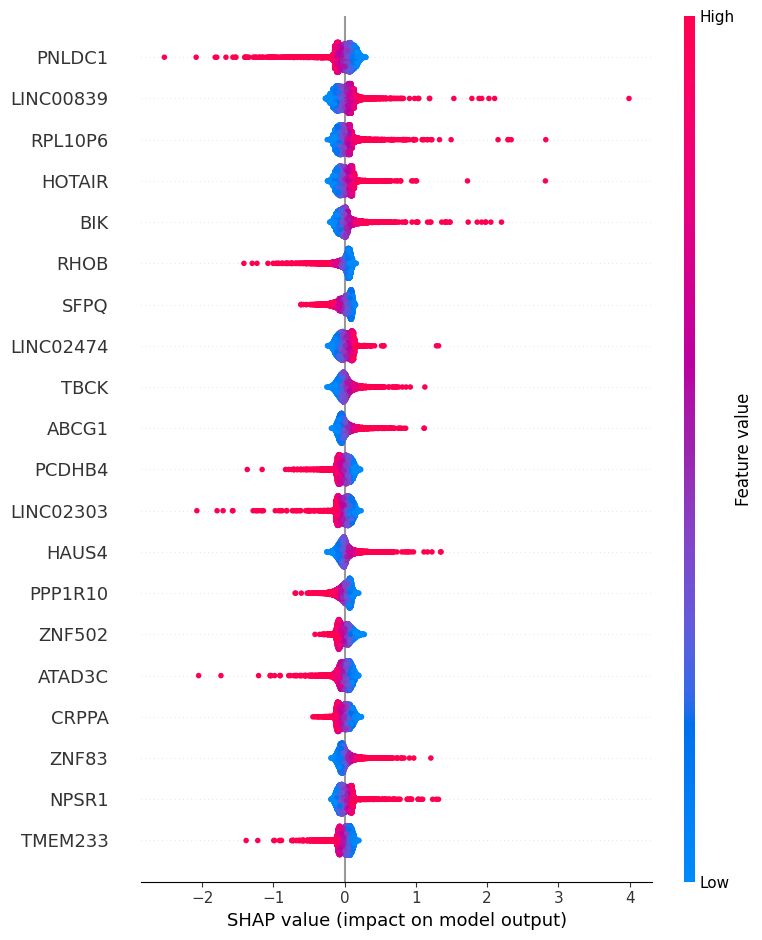

In [20]:
shap.summary_plot(shap_values_np, X_sample_np, feature_names=feature_names_original)

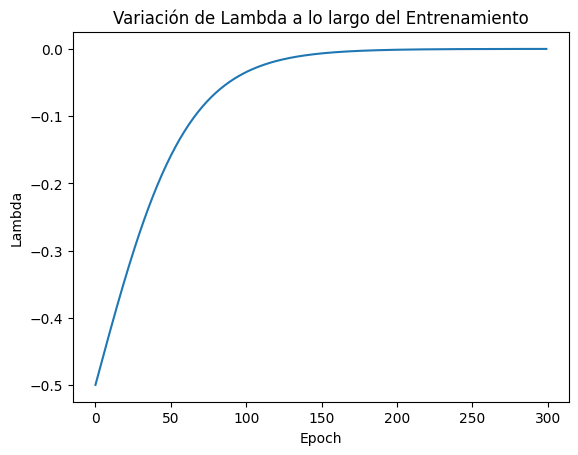

In [18]:
import numpy as np

max_epochs = 300
lambda_values = []

for epoch in range(max_epochs):
    lambda_ = 1.0 / (1. + np.exp(-10 * epoch / max_epochs)) - 1
    lambda_values.append(lambda_)

# Para visualizar los valores
import matplotlib.pyplot as plt
plt.plot(range(max_epochs), lambda_values)
plt.xlabel('Epoch')
plt.ylabel('Lambda')
plt.title('Variación de Lambda a lo largo del Entrenamiento')
plt.show()

In [56]:
shaps_dataframe = pd.DataFrame(X_sample_np,columns=feature_names_original,index=df.index )
shaps_dataframe

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
9fe7d0f4-866d-490f-b2cb-d9be7da889de,1.467331,1.142452,-0.065460,2.043364,1.323197,2.260592,-0.543520,1.342021,-0.153161,1.469917,...,0.656431,1.468443,-0.903450,-0.928070,1.469976,-1.195103,-0.963842,1.470024,1.470024,1.473490
dd74434f-300f-4798-8342-aad31b192e12,-0.046951,-0.060058,-0.052520,-0.154958,-0.165800,-0.309534,-0.155566,-0.078710,-0.215778,-0.048581,...,-0.177968,-0.048132,-0.918525,0.065486,-0.046385,-0.639196,-0.720347,-0.046343,-0.046343,-0.046301
07db9e9d-059d-4e6c-b483-81517a492b96,-1.677100,-1.349697,-0.085949,-1.033025,-1.898186,1.154908,-0.017938,-1.788310,-0.322478,-1.677105,...,-1.335548,-1.674593,0.848071,1.308718,-1.672617,1.413151,1.528549,-1.672580,-1.672580,-1.673411
47ee860a-fd18-48f2-bfe7-4e19391950bd,1.758680,1.373363,-0.064350,6.818701,1.841238,2.097798,0.112098,1.700703,-0.137414,1.761507,...,0.862329,1.759663,-0.460034,-1.235194,1.761155,-1.034353,-0.821879,1.761204,1.761204,1.758830
e322b0e5-458a-4cbf-a64f-9b348e413939,-1.085258,-0.886410,-0.082812,-0.721275,-1.439534,-0.586969,-0.484401,-1.251336,0.045995,-1.092078,...,-0.857580,-1.090307,0.494983,0.800564,-1.088413,-0.816230,0.511899,-1.088375,-1.088375,-1.085981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,-0.516218,-0.436603,-0.078663,-0.399741,-0.596248,1.877146,1.631811,-0.457627,-0.259644,-0.524073,...,-0.565304,-0.523022,2.045666,0.091652,-0.521208,0.946180,0.534175,-0.521167,-0.521167,-0.528637
673a85f3-ba5e-448a-acee-dfec77b5238e,-0.136291,-0.135137,-0.074132,-0.158724,-0.006297,-0.334107,-0.173230,-0.266608,-0.198477,-0.143389,...,-0.071335,-0.142820,0.728269,0.478136,-0.141060,-1.058035,0.138515,-0.141018,-0.141018,-0.141826
3d93b2ae-7730-4914-af23-ff3554752922,0.910972,0.703031,-0.020848,0.356467,0.808877,-0.055073,-0.219615,0.793256,-0.153139,0.915028,...,0.297457,0.912331,0.169904,-0.937012,0.913942,-0.153099,-0.953923,0.913988,0.913988,0.910132
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,-0.077051,-0.105612,-0.052296,-0.017876,0.708038,-0.328177,-0.662009,0.064948,-0.227030,-0.109902,...,-0.330421,-0.109375,0.220152,1.978804,-0.107620,4.143768,3.207013,-0.107577,-0.107577,-0.067218


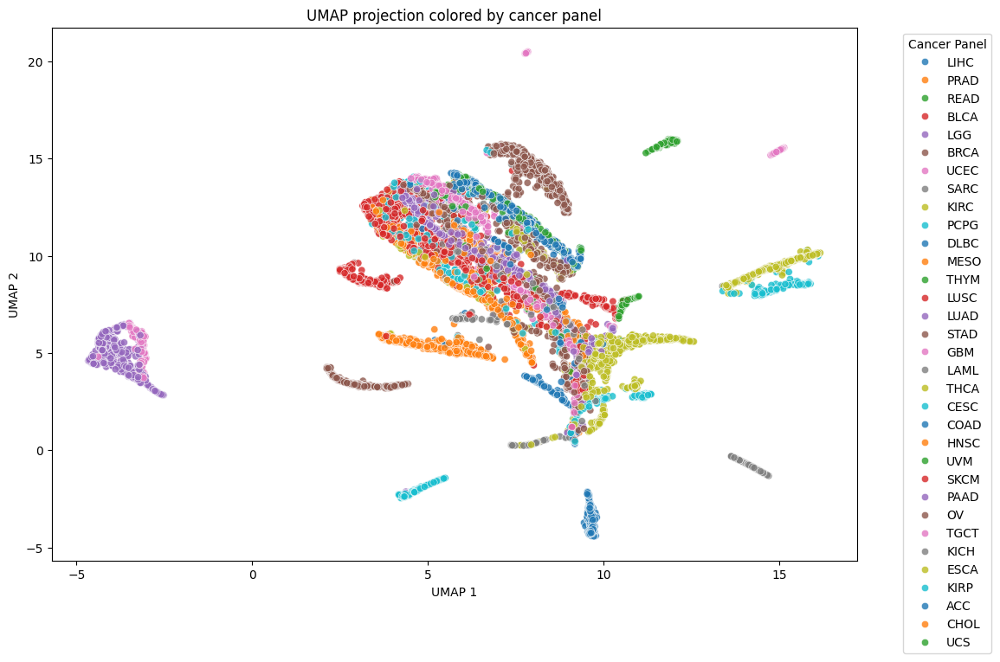

                                         UMAP_1     UMAP_2 panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de   9.548903  -3.850536  LIHC
dd74434f-300f-4798-8342-aad31b192e12   5.362109   5.562799  PRAD
07db9e9d-059d-4e6c-b483-81517a492b96   5.734986  14.058342  READ
47ee860a-fd18-48f2-bfe7-4e19391950bd   9.576952  -3.204091  LIHC
e322b0e5-458a-4cbf-a64f-9b348e413939   3.913453  12.047890  BLCA
...                                         ...        ...   ...
62cb41b1-8960-4fa2-8f74-38dd174af004  15.332159   9.743530  KIRC
673a85f3-ba5e-448a-acee-dfec77b5238e   6.666833   9.343993   UCS
3d93b2ae-7730-4914-af23-ff3554752922  -3.514543   3.851691   LGG
85a0b88f-2b89-4117-9e04-b81fad7f2e1b  14.462225  -1.082147  LAML
a512642f-b720-4efb-a4e9-49b746980809   9.998926   3.796515  THCA

[10286 rows x 3 columns]


In [59]:
import pandas as pd
import umap
import matplotlib.pyplot as plt
import seaborn as sns

# Asumiendo que shap_df es el DataFrame con los valores SHAP y df['panel'] contiene las etiquetas
# df['panel'] tiene las categorías que deseas visualizar

def generate_umap_with_labels(shap_df, panel_column, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean'):
    # Crear el modelo UMAP
    umap_model = umap.UMAP(n_neighbors=n_neighbors,
                           min_dist=min_dist,
                           n_components=n_components,
                           metric=metric)

    # Ajustar UMAP a los valores SHAP
    umap_embedding = umap_model.fit_transform(shaps_dataframe)

    # Convertir el resultado de UMAP en un DataFrame para facilitar el análisis
    umap_df = pd.DataFrame(umap_embedding, columns=[f'UMAP_{i+1}' for i in range(n_components)], index=shap_df.index)

    # Agregar la columna 'panel' con las etiquetas de los diferentes cánceres
    umap_df['panel'] = panel_column

    # Visualización con colores basados en las categorías de 'panel'
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x='UMAP_1', y='UMAP_2', hue='panel', data=umap_df, palette='tab10', alpha=0.8)
    plt.title('UMAP projection colored by cancer panel')
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.legend(title='Cancer Panel', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    return umap_df

# Supongamos que 'shap_df' es tu DataFrame de valores SHAP y 'df["panel"]' contiene las categorías
umap_result = generate_umap_with_labels(shaps_dataframe, df['panel'])

# Mostrar el resultado del UMAP con etiquetas
print(umap_result)


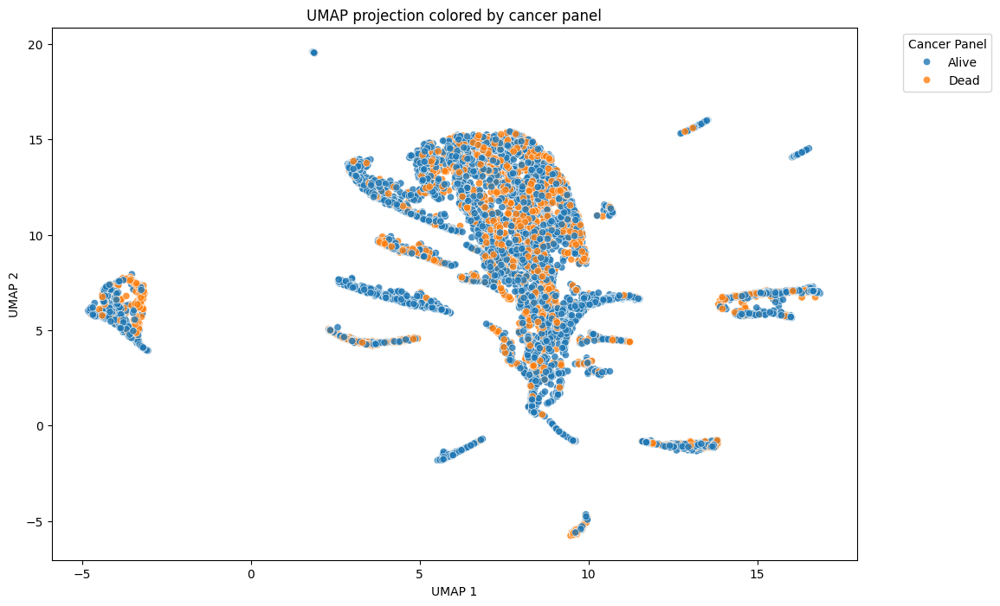

                                         UMAP_1     UMAP_2  panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de  13.328126  -1.260253  Alive
dd74434f-300f-4798-8342-aad31b192e12   4.431898   6.944249  Alive
07db9e9d-059d-4e6c-b483-81517a492b96   5.904613  14.492803   Dead
47ee860a-fd18-48f2-bfe7-4e19391950bd  12.620243  -1.140841  Alive
e322b0e5-458a-4cbf-a64f-9b348e413939   7.923174  14.551563   Dead
...                                         ...        ...    ...
62cb41b1-8960-4fa2-8f74-38dd174af004  16.058805   7.046614   Dead
673a85f3-ba5e-448a-acee-dfec77b5238e   7.721750  10.459006  Alive
3d93b2ae-7730-4914-af23-ff3554752922  -3.851415   5.108287  Alive
85a0b88f-2b89-4117-9e04-b81fad7f2e1b   9.616403  -5.601651  Alive
a512642f-b720-4efb-a4e9-49b746980809   9.229086   4.069495  Alive

[10286 rows x 3 columns]


In [60]:
# Supongamos que 'shap_df' es tu DataFrame de valores SHAP y 'df["panel"]' contiene las categorías
umap_result = generate_umap_with_labels(shaps_dataframe, df['vital'])

# Mostrar el resultado del UMAP con etiquetas
print(umap_result)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import umap
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors  # Para calcular los vecinos más cercanos
def plot_umap_with_gene_expression(df, df_VIS, gene_to_plot, smooth=False, n_neighbors=10, n_pca_components=50):
    """
    Función para graficar proyecciones UMAP con la expresión génica, con opción de suavizado.

    Parameters:
    - df: DataFrame con las expresiones génicas (original).
    - df_VIS: DataFrame con las coordenadas UMAP y otros datos.
    - gene_to_plot: String con el nombre del gen a visualizar.
    - smooth: Booleano que indica si se aplica suavizado a la expresión génica (por vecinos cercanos).
    - n_neighbors: Número de vecinos cercanos para el suavizado.
    - n_pca_components: Número de componentes principales a usar en PCA antes de UMAP.
    """

    # Verificar si la columna del gen está en el DataFrame original
    if gene_to_plot not in df.columns:
        raise KeyError(f"Error: La columna '{gene_to_plot}' no existe en el DataFrame 'df'.")

    # Excluir columnas no numéricas (como 'vital') para PCA y UMAP
    numeric_df = df.select_dtypes(include=[np.number])

    # Paso 1: Aplicar PCA a los datos numéricos antes de UMAP
    pca = PCA(n_components=n_pca_components)
    pca_result = pca.fit_transform(numeric_df)

    # Paso 2: Aplicar UMAP a los datos transformados por PCA
    reducer = umap.UMAP()
    umap_embedding = reducer.fit_transform(pca_result)

    # Actualizar el DataFrame de visualización con las nuevas coordenadas UMAP
    df_VIS['UMAP1'] = umap_embedding[:, 0]
    df_VIS['UMAP2'] = umap_embedding[:, 1]

    # Añadir una columna log-transformada del gen seleccionado al DataFrame de visualización (df_VIS)
    df_VIS[gene_to_plot] = np.log(df[gene_to_plot] + 1)  # Tomar la columna del df original
    df_VIS['vital'] = df['vital']  # Asegurarse de que la columna 'vital' también esté en df_VIS

    # Obtener las coordenadas UMAP de df_VIS
    coordinates = df_VIS[['UMAP1', 'UMAP2']].values

    # Si se selecciona suavizado
    if smooth:
        nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(coordinates)
        distances, indices = nbrs.kneighbors(coordinates)

        # Promediar la expresión génica de los vecinos más cercanos
        smoothed_expression = np.zeros(df_VIS[gene_to_plot].shape)
        for i, neighbors in enumerate(indices):
            smoothed_expression[i] = np.mean(df_VIS.iloc[neighbors][gene_to_plot])
        df_VIS[f'{gene_to_plot}_smoothed'] = smoothed_expression
        expression_column = f'{gene_to_plot}_smoothed'
    else:
        expression_column = gene_to_plot

    # Crear una figura con dos subplots (1 fila, 2 columnas)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Primera gráfica: UMAP con la expresión del gen seleccionado (suavizada o no)
    scatter1 = axes[0].scatter(
        x=df_VIS['UMAP1'],
        y=df_VIS['UMAP2'],
        c=df_VIS[expression_column],
        cmap='Spectral',
        s=5
    )
    axes[0].set_title(f'UMAP Projection with {expression_column} Expression')
    axes[0].set_xlabel('UMAP1')
    axes[0].set_ylabel('UMAP2')

    # Añadir la barra de color para la primera gráfica
    cbar1 = fig.colorbar(scatter1, ax=axes[0])
    cbar1.set_label(f'{expression_column} Expression')

    # Segunda gráfica: UMAP con 'vital' como color categórico usando Seaborn
    sns.scatterplot(
        x='UMAP1',
        y='UMAP2',
        hue='vital',
        palette='Set1',  # Puedes cambiar la paleta si lo prefieres
        data=df_VIS,
        ax=axes[1],
        s=5
    )
    axes[1].set_title('UMAP Projection with Vital Status')
    axes[1].set_xlabel('UMAP1')
    axes[1].set_ylabel('UMAP2')

    # Mostrar ambas gráficas
    plt.tight_layout()
    plt.show()

# Supongo que df es el DataFrame original con las expresiones génicas
# y df_VIS contiene las coordenadas UMAP y otras variables
df_VIS = final_df[final_df['epochs'] == 29].set_index('index').copy()

# Llamar a la función con ambos DataFrames y suavizado o sin suavizado
plot_umap_with_gene_expression(df, df_VIS, gene_to_plot='VIM', smooth=True, n_neighbors=40, n_pca_components=50)


In [ ]:
df_VIS